# Import Library

In [1]:
!python --version

Python 3.12.12


In [2]:
!pip install skl2onnx onnx onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 103.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 57.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.7 MB/s eta 0:00:00


In [3]:
import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from scipy.signal import convolve2d
import skl2onnx
from skl2onnx import convert_sklearn
from skl2onnx.common.data_types import FloatTensorType
from sklearn.preprocessing import MinMaxScaler
import onnx
import warnings
import joblib
import re
import random
import onnxruntime as ort
from google.colab import files
from collections import defaultdict, OrderedDict
import glob

warnings.filterwarnings('ignore')

# Load Gambar

In [4]:
!unzip /content/drive/MyDrive/dataset_ts_new.zip

Archive:  /content/drive/MyDrive/dataset_ts_new.zip
   creating: dataset_ts_new/
   creating: dataset_ts_new/test/
   creating: dataset_ts_new/test/lampu-merah/
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (100).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (71).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (72).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (73).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (74).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (75).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (76).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (77).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (78).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (79).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (80).jpg  
  inflating: dataset_ts_new/test/lampu-merah/lampu merah (81).jpg  
  inflating: dataset_t

In [5]:
def load_dataset(img_dir):
    p = Path(img_dir)
    dirs = p.glob('*')
    img_list = []

    for dir_path in dirs:
        if not dir_path.is_dir():
            continue

        label = str(dir_path).split('/')[-1]

        for file in dir_path.glob('*.jpg'):
            try:
                img_bgr = cv2.imread(str(file))
                img_bgr = cv2.resize(img_bgr, [64, 64])

                if img_bgr is not None:
                    img_list.append((img_bgr, label))

            except Exception as e:
                print(f"Error memuat file {file}: {e}")

    return img_list

In [6]:
train_dir = "/content/dataset_ts_new/train/"
test_dir = "/content/dataset_ts_new/test/"

train_data = load_dataset(train_dir)
test_data = load_dataset(test_dir)

full_dataset = train_data + test_data
print(f"\nTotal Sampel Keseluruhan: {len(full_dataset)}")

images = [item[0] for item in full_dataset]
labels = [item[1] for item in full_dataset]


Total Sampel Keseluruhan: 1300


70:30

In [7]:
X_train_img_73, X_test_img_73, y_train_str_73, y_test_str_73 = train_test_split(
    images,
    labels,
    test_size=0.3,
    random_state=42,
    stratify=labels
)

print(f"Jumlah Sampel Training (70%): {len(X_train_img_73)}")
print(f"Jumlah Sampel Testing (30%): {len(X_test_img_73)}")

Jumlah Sampel Training (70%): 910
Jumlah Sampel Testing (30%): 390


80:20

In [8]:
X_train_img_82, X_test_img_82, y_train_str_82, y_test_str_82 = train_test_split(
    images,
    labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

print(f"Jumlah Sampel Training (80%): {len(X_train_img_82)}")
print(f"Jumlah Sampel Testing (20%): {len(X_test_img_82)}")

Jumlah Sampel Training (80%): 1040
Jumlah Sampel Testing (20%): 260


90:10

In [9]:
X_train_img_91, X_test_img_91, y_train_str_91, y_test_str_91 = train_test_split(
    images,
    labels,
    test_size=0.1,
    random_state=42,
    stratify=labels
)

print(f"Jumlah Sampel Training (90%): {len(X_train_img_91)}")
print(f"Jumlah Sampel Testing (10%): {len(X_test_img_91)}")

Jumlah Sampel Training (90%): 1170
Jumlah Sampel Testing (10%): 130


# Pre-processing (HSV)

In [10]:
def hsv_preprocessing(images, labels, list_label):
    hsv_img_list = []
    class_list = list_label.copy()
    for i, l in zip(images, labels):
      hsv_image = cv2.cvtColor(i, cv2.COLOR_BGR2HSV)
      color_hist = cv2.calcHist([hsv_image], [0, 1], None, [16, 8], [0, 180, 0, 256])

      cv2.normalize(color_hist, color_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

      color_features = color_hist.flatten()

      hsv_img_list.append(color_features)

      if l in class_list:
        class_list.remove(l)

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        fig.suptitle(f"Analisis Gambar (Kelas: {l})", fontsize=16)

        img_rgb = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
        axes[0].imshow(img_rgb)
        axes[0].set_title("1. Gambar Asli (RGB)")
        axes[0].axis('off')

        h_channel = hsv_image[:, :, 0]

        axes[1].hist(h_channel.flatten(), bins=180, range=[0, 180], color='blue')
        axes[1].set_title("2. Histogram Persebaran Warna (Hue)")
        axes[1].set_xlabel("Nilai Hue (0-179)")
        axes[1].set_ylabel("Jumlah Piksel")
        axes[1].set_xlim([0, 180])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    return hsv_img_list

In [11]:
list_label = [
    'lampu-merah',
    'larangan-belok-kiri', 'larangan-berhenti',
    'larangan-berjalan-terus-wajib-berhenti-sesaat',
    'larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor',
    'larangan-memutar-balik', 'larangan-parkir',
    'peringatan-pintu-perlintasan-kereta-api',
    'perintah-pilihan-memasuki-salah-satu-jalur', 'petunjuk-area-parkir',
    'petunjuk-lokasi-pemberhentian-bus', 'petunjuk-lokasi-putar-balik',
    'petunjuk-penyeberangan-pejalan-kaki'
]

70:30

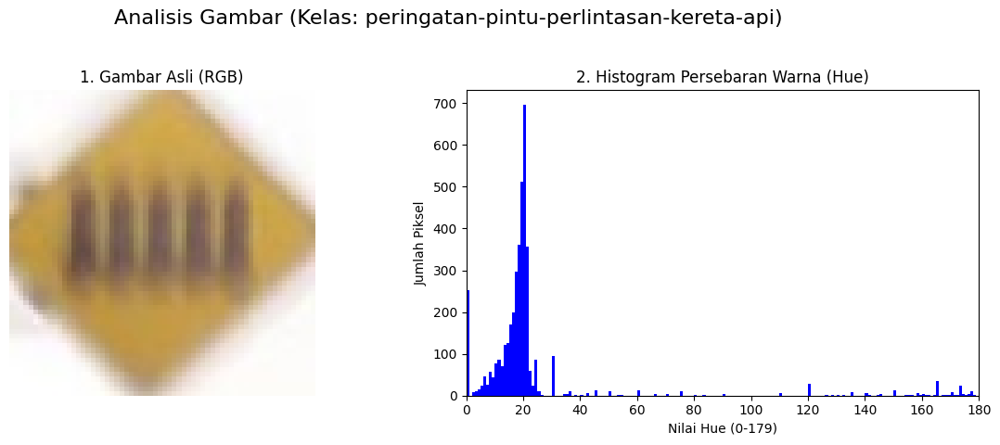

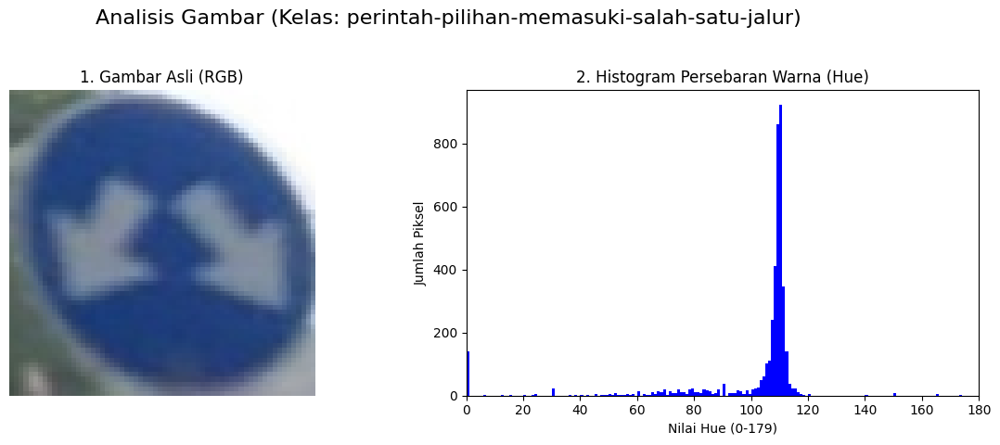

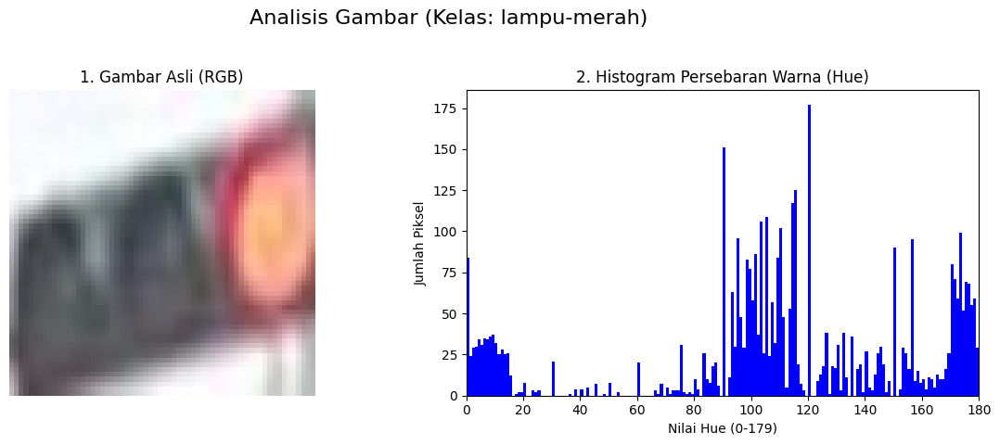

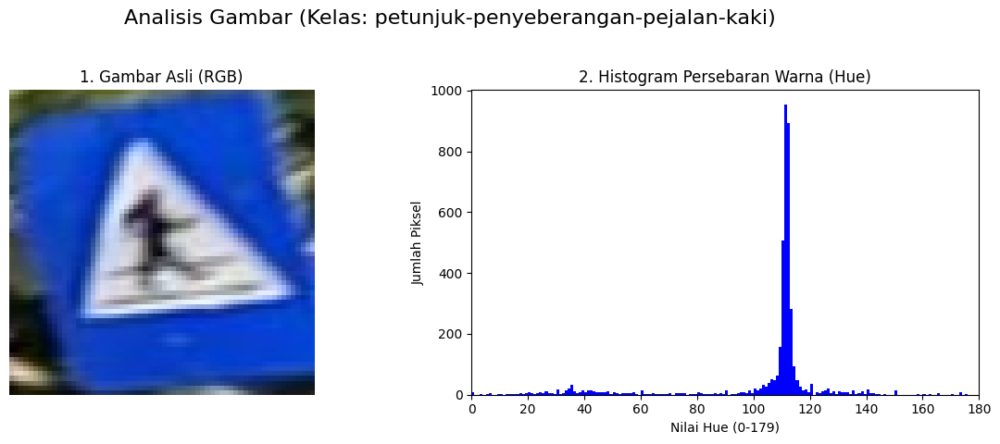

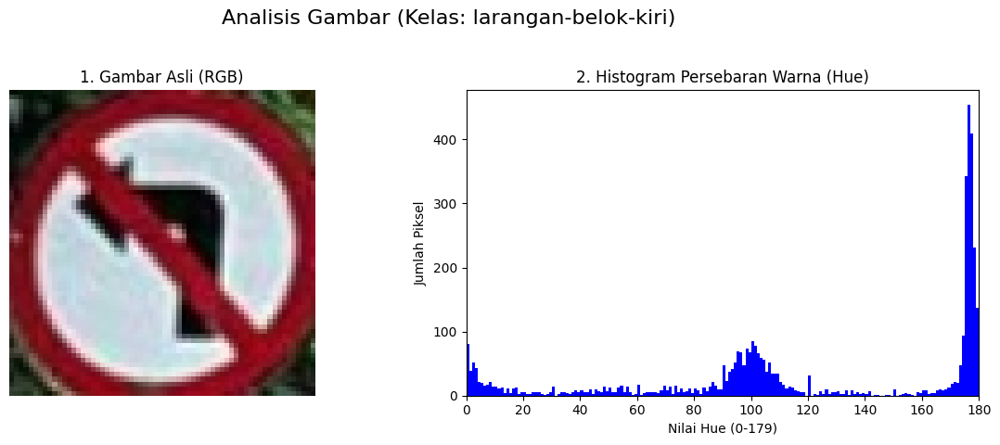

...

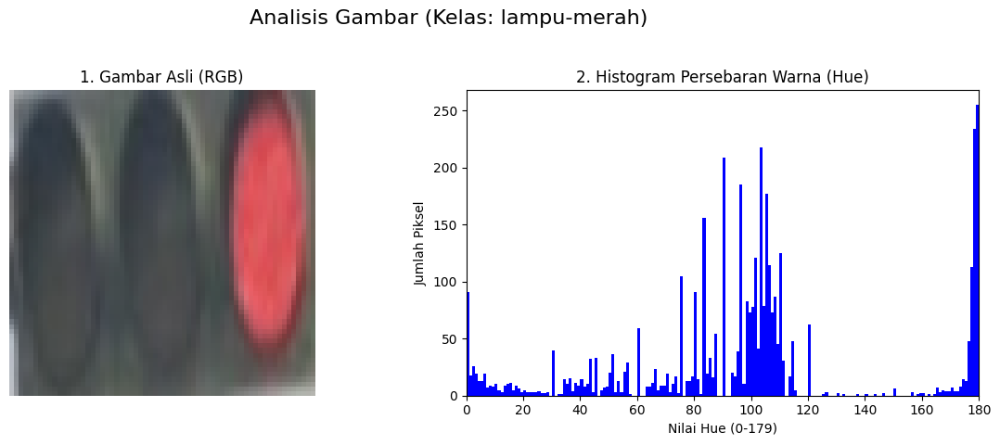

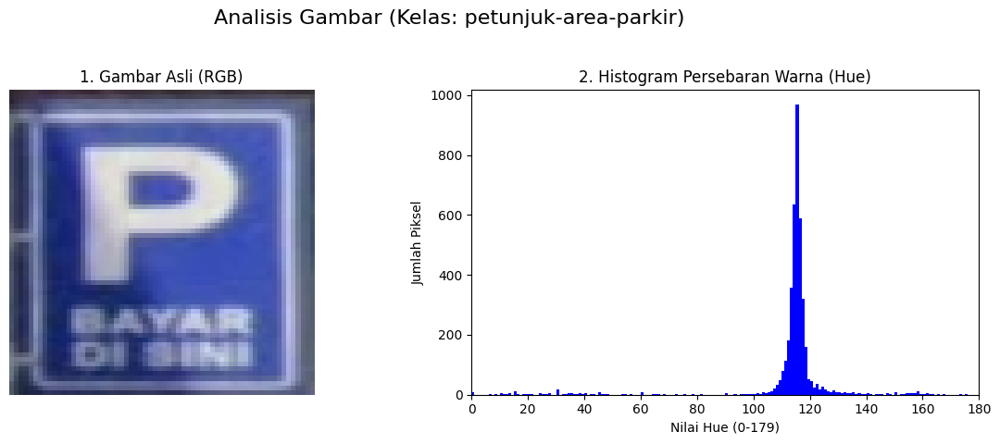

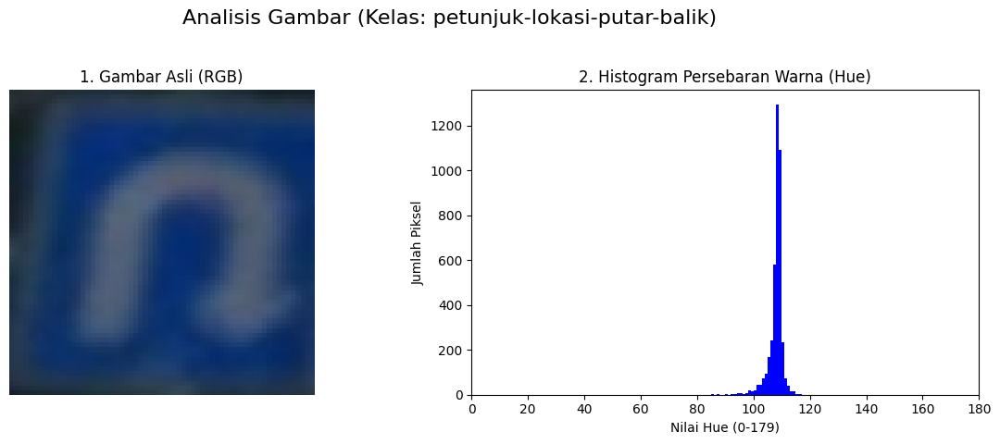

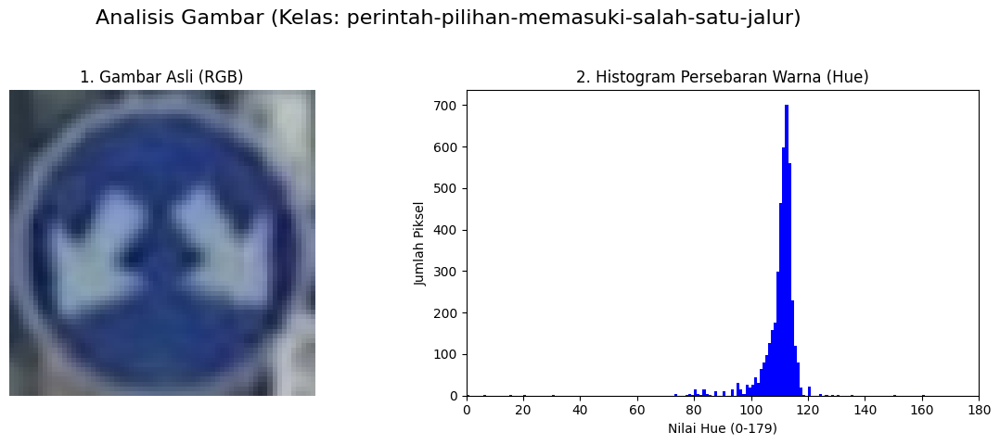

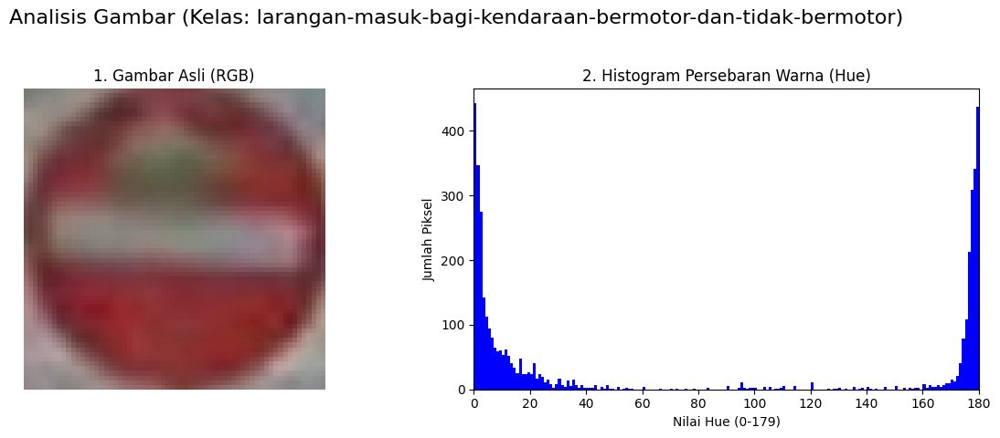

In [12]:
train_hsv_73 = hsv_preprocessing(X_train_img_73, y_train_str_73, list_label)
test_hsv_73 = hsv_preprocessing(X_test_img_73, y_test_str_73, list_label)

80:20

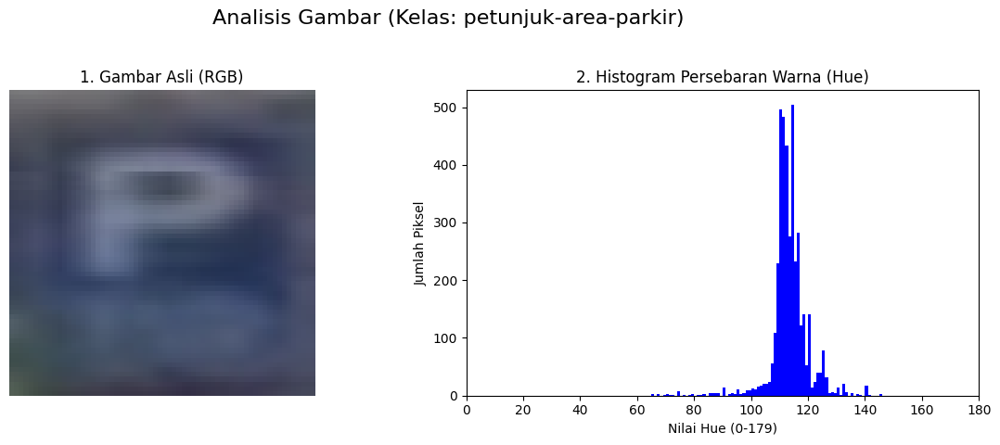

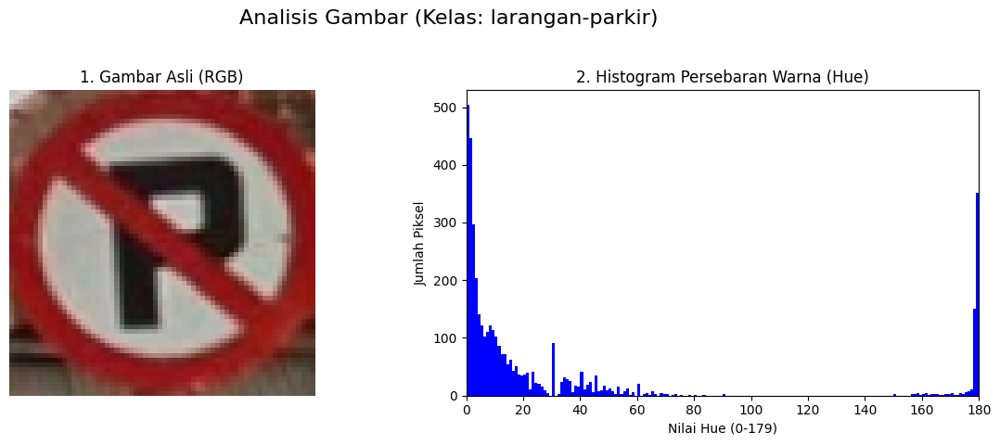

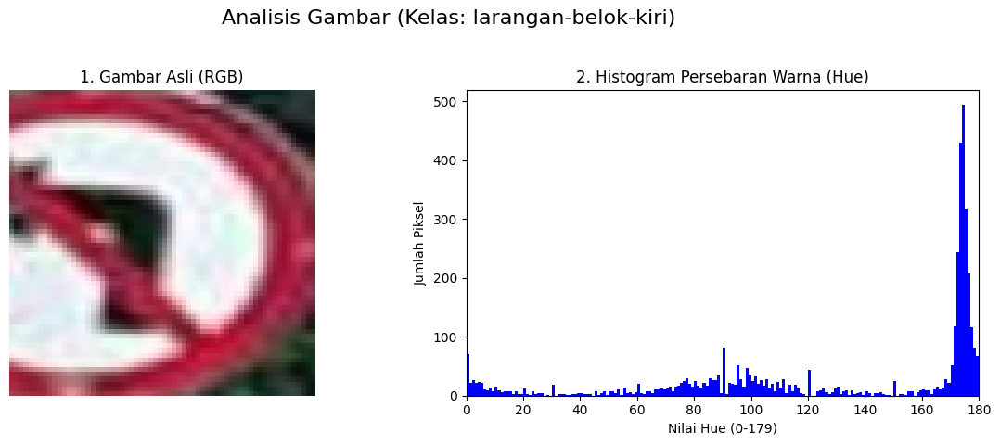

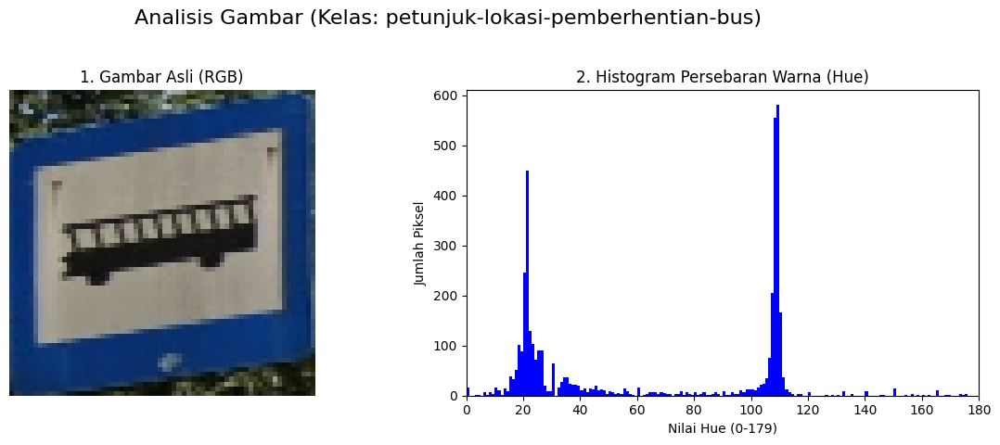

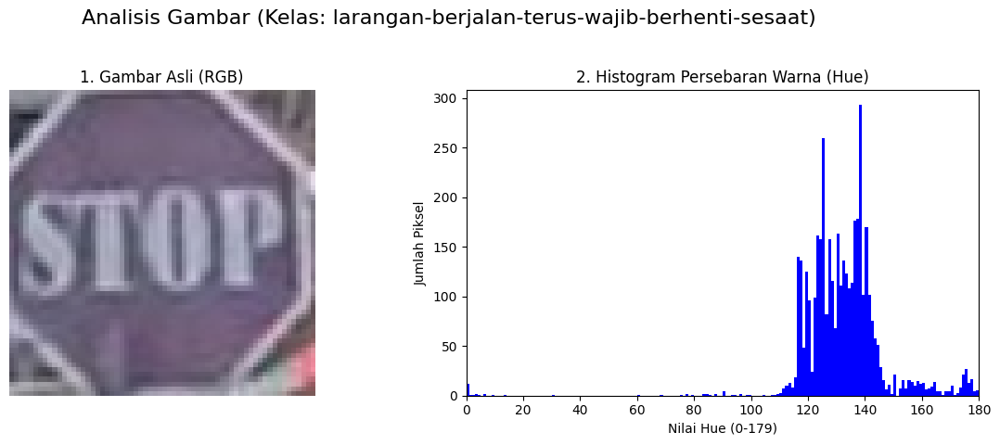

...

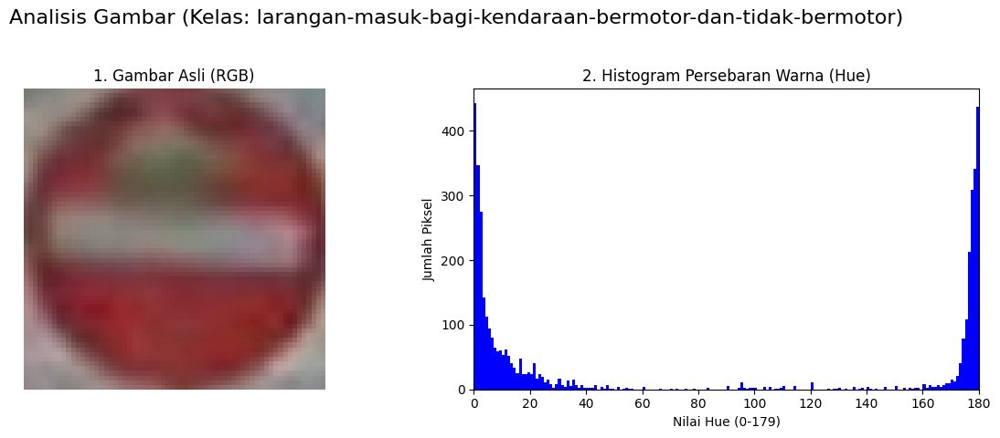

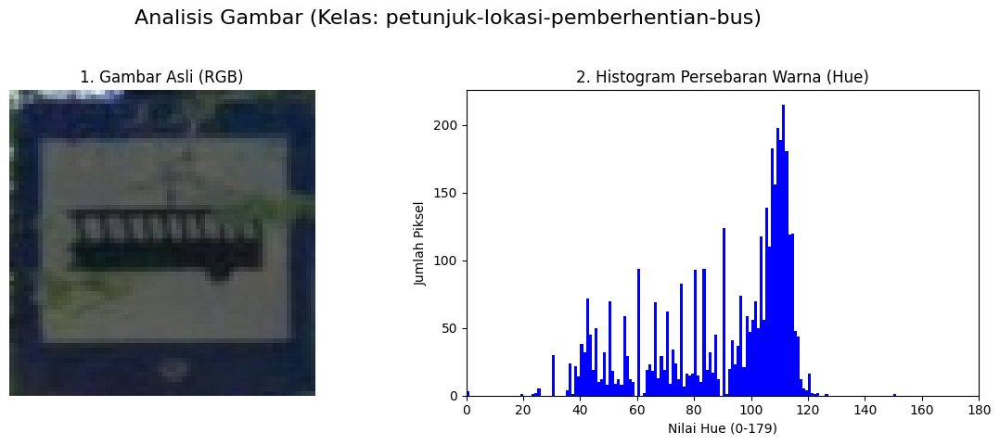

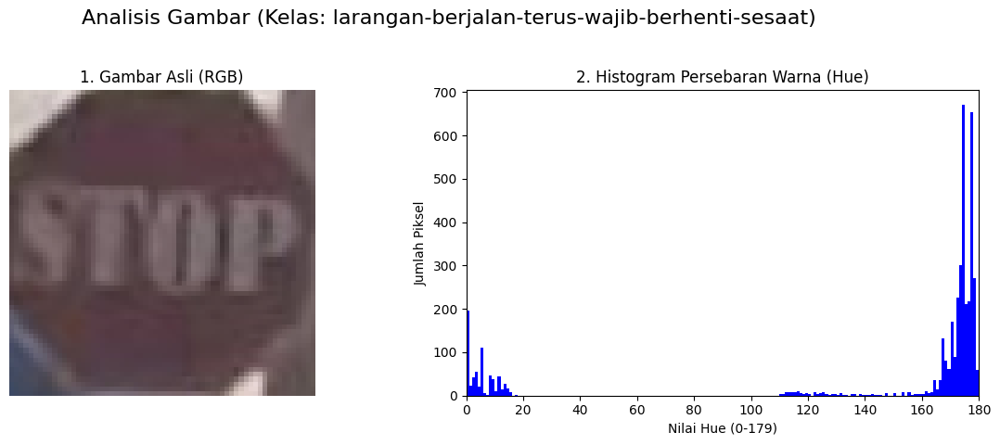

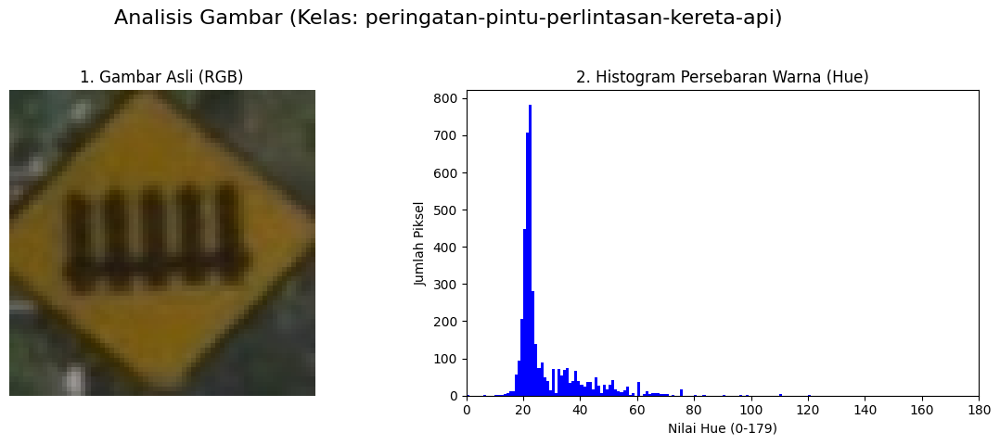

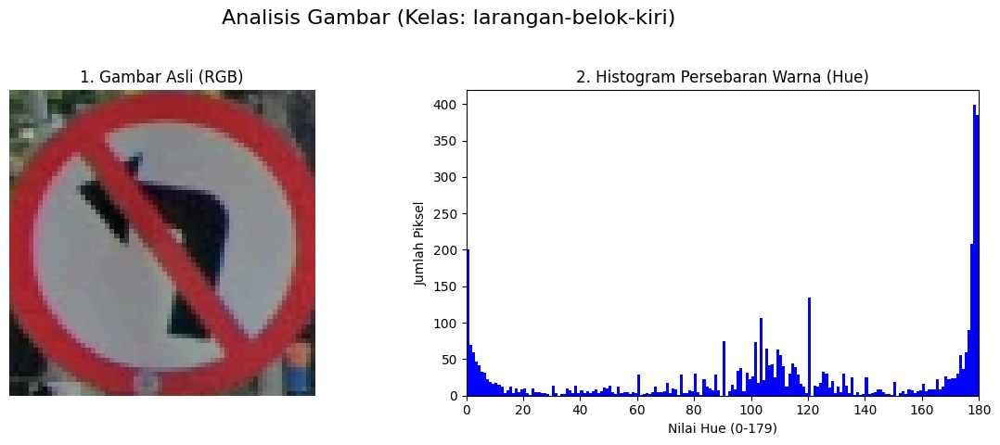

In [13]:
train_hsv_82 = hsv_preprocessing(X_train_img_82, y_train_str_82, list_label)
test_hsv_82 = hsv_preprocessing(X_test_img_82, y_test_str_82, list_label)

90:10

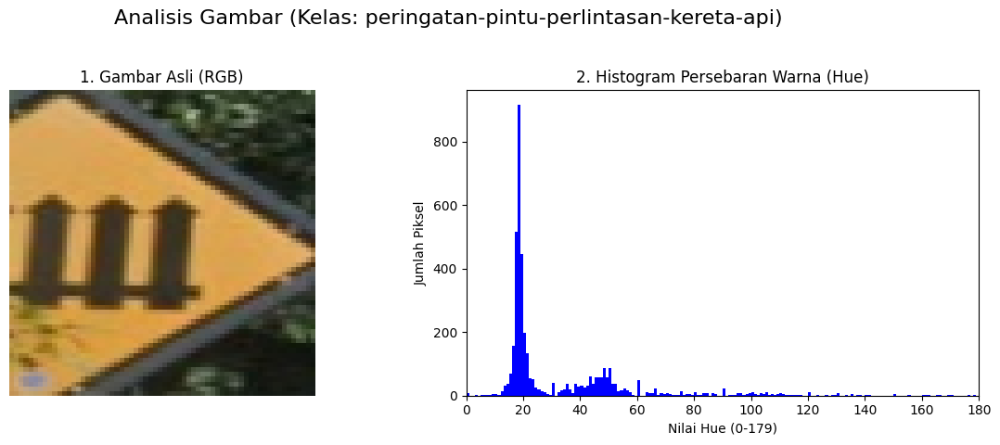

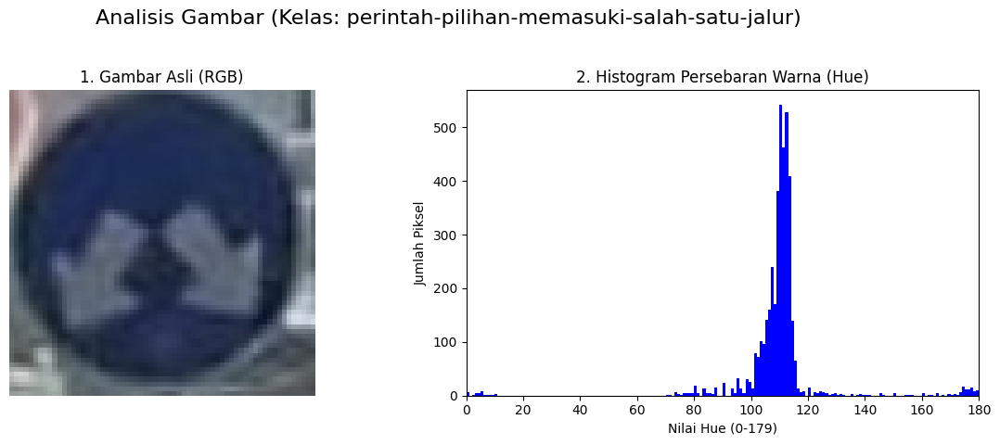

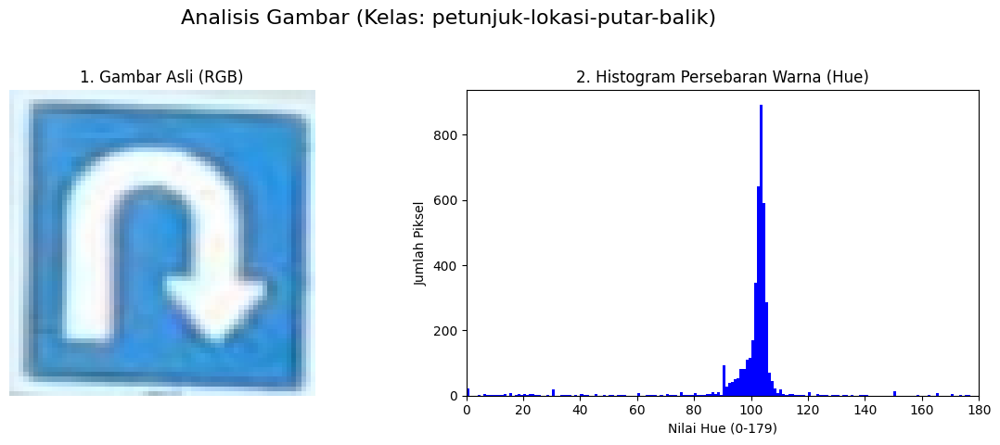

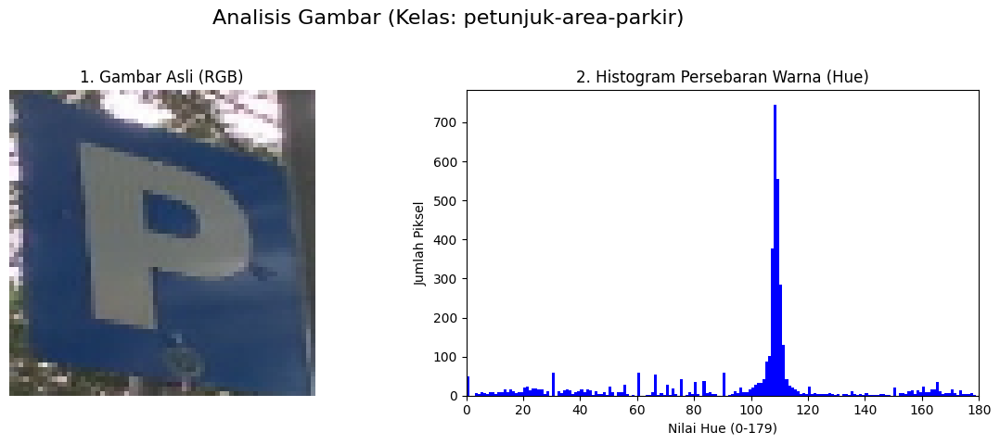

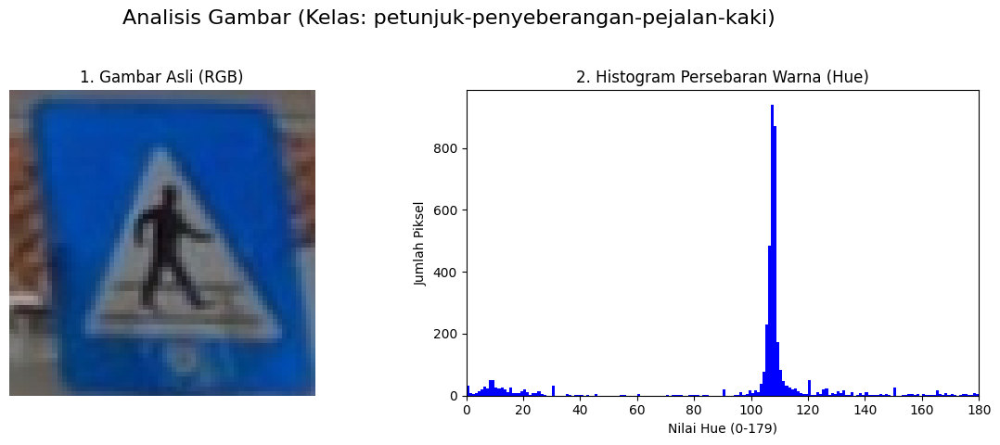

...

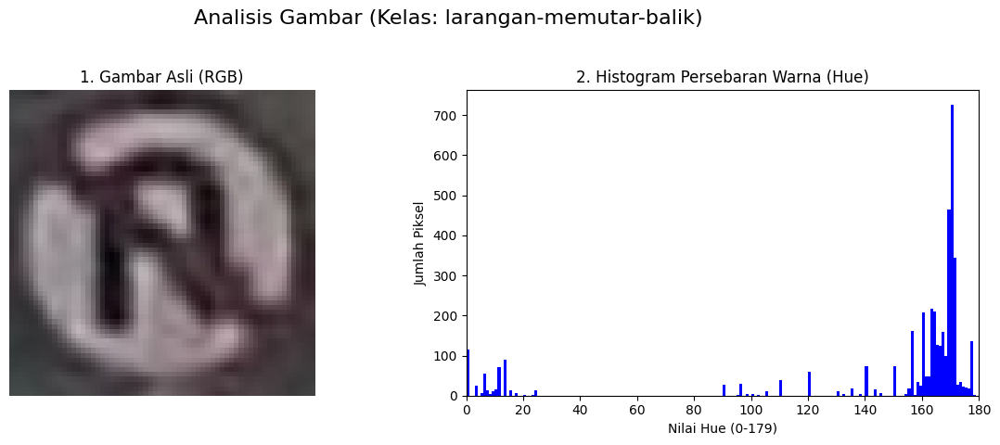

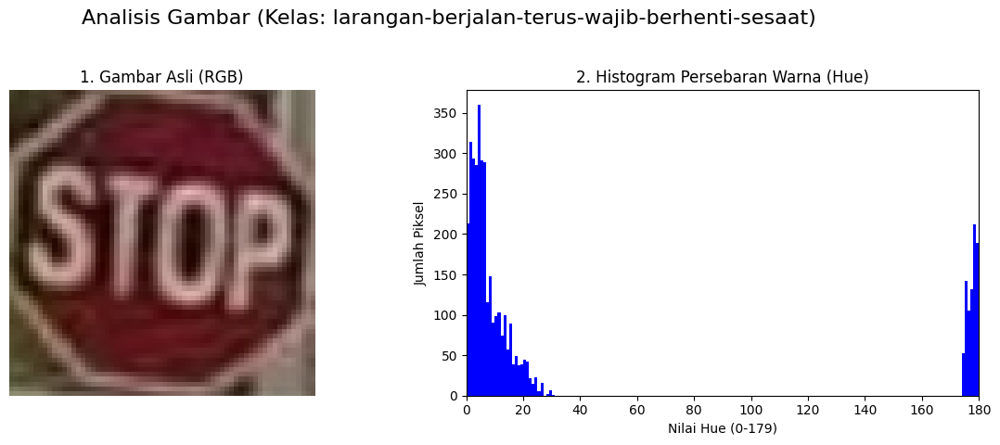

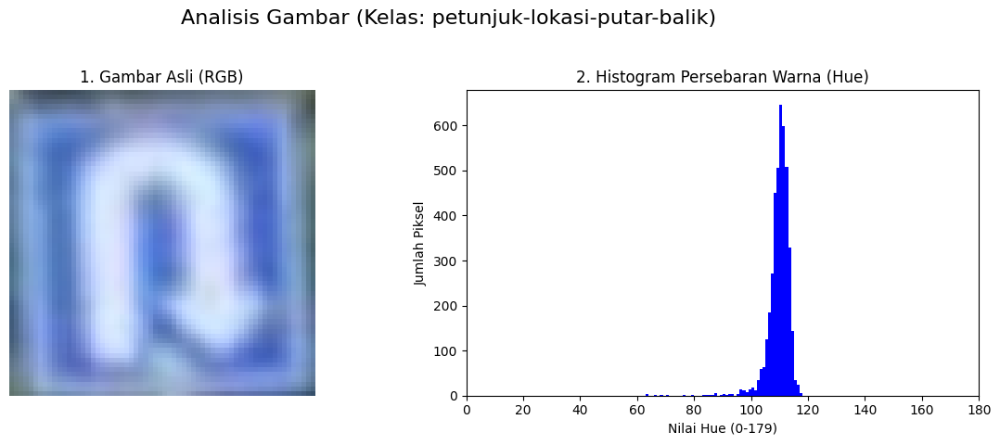

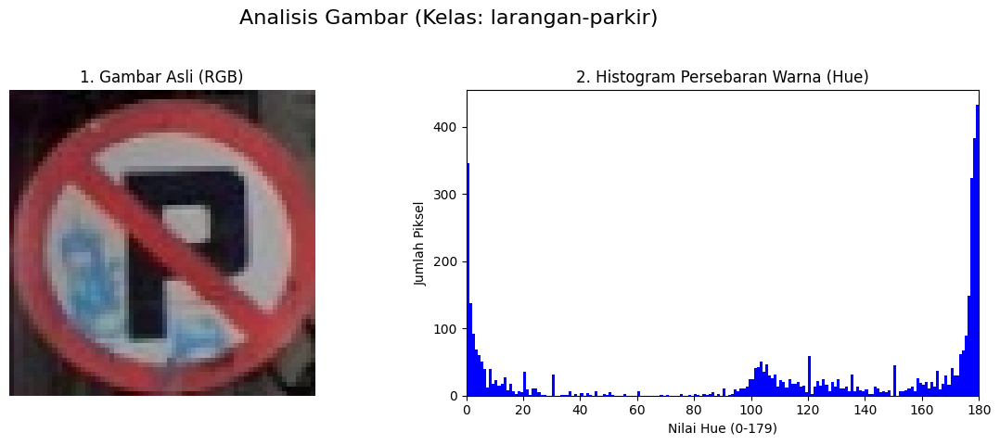

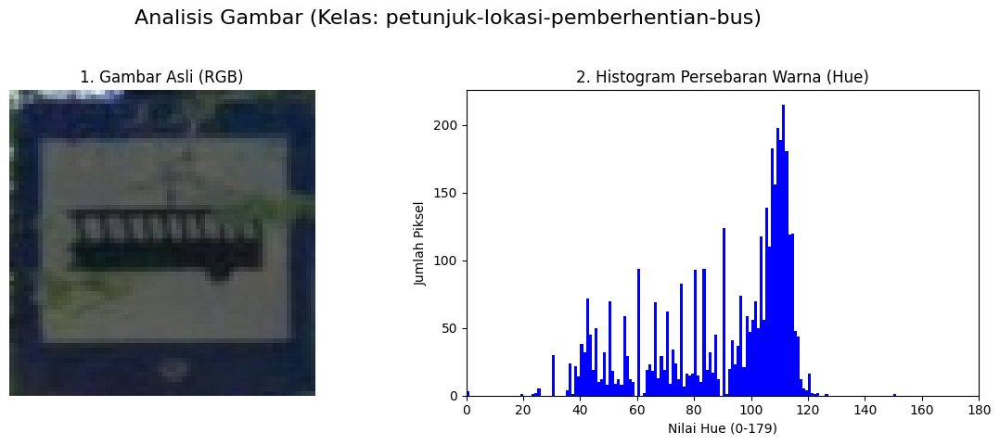

In [14]:
train_hsv_91 = hsv_preprocessing(X_train_img_91, y_train_str_91, list_label)
test_hsv_91 = hsv_preprocessing(X_test_img_91, y_test_str_91, list_label)

# Feature Extraction (HOG)

In [15]:
# def get_gradients(gray_image):
#     """Menghitung magnitudo dan orientasi gradien."""
#     sobel_x = np.array([[-1, 0, 1],
#                         [-2, 0, 2],
#                         [-1, 0, 1]])

#     sobel_y = np.array([[-1, -2, -1],
#                         [ 0,  0,  0],
#                         [ 1,  2,  1]])

#     Gx = convolve2d(gray_image, sobel_x, mode='same', boundary='symm')
#     Gy = convolve2d(gray_image, sobel_y, mode='same', boundary='symm')

#     magnitude = np.sqrt(Gx**2 + Gy**2)
#     orientation_rad = np.arctan2(Gy, Gx)

#     orientation_deg = np.degrees(orientation_rad) % 180

#     return magnitude, orientation_deg

# def manual_hog_extractor(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_bins=9):
#     """
#     Mengimplementasikan HOG secara manual menggunakan NumPy.

#     Langkah 1: Menghitung gradien (magnitudo & orientasi).
#     Langkah 2: Membuat histogram orientasi untuk setiap 'cell'.
#     Langkah 3 & 4: Normalisasi histogram dalam 'block' yang tumpang tindih.
#     Langkah 5: Menggabungkan semua vektor blok menjadi satu vektor fitur.
#     """

#     magnitude, orientation = get_gradients(gray_image)

#     img_h, img_w = gray_image.shape
#     cell_h, cell_w = pixels_per_cell
#     block_h, block_w = cells_per_block

#     n_cells_y = img_h // cell_h
#     n_cells_x = img_w // cell_w

#     bin_size = 180.0 / n_bins

#     cell_histograms = np.zeros((n_cells_y, n_cells_x, n_bins))

#     for y in range(n_cells_y):
#         for x in range(n_cells_x):
#             cell_y_start = y * cell_h
#             cell_y_end = (y + 1) * cell_h
#             cell_x_start = x * cell_w
#             cell_x_end = (x + 1) * cell_w

#             magnitude_cell = magnitude[cell_y_start:cell_y_end, cell_x_start:cell_x_end]
#             orientation_cell = orientation[cell_y_start:cell_y_end, cell_x_start:cell_x_end]

#             hist = np.zeros(n_bins)

#             for r in range(cell_h):
#                 for c in range(cell_w):
#                     mag = magnitude_cell[r, c]
#                     ori = orientation_cell[r, c]

#                     bin_idx_float = ori / bin_size
#                     bin_1 = int(np.floor(bin_idx_float - 0.5))
#                     bin_2 = int(np.floor(bin_idx_float + 0.5))

#                     weight_2 = (bin_idx_float - (bin_1 + 0.5))
#                     weight_1 = 1.0 - weight_2

#                     hist[bin_1 % n_bins] += weight_1 * mag
#                     hist[bin_2 % n_bins] += weight_2 * mag

#             cell_histograms[y, x, :] = hist


#     n_blocks_y = n_cells_y - block_h + 1
#     n_blocks_x = n_cells_x - block_w + 1

#     all_blocks_list = []

#     epsilon = 1e-5

#     for by in range(n_blocks_y):
#         for bx in range(n_blocks_x):

#             block = cell_histograms[by : by + block_h,
#                                     bx : bx + block_w,
#                                     :]

#             block_vector = block.ravel()

#             norm = np.sqrt(np.sum(block_vector**2) + epsilon)
#             block_normalized = block_vector / norm

#             all_blocks_list.append(block_normalized)

#     final_feature_vector = np.concatenate(all_blocks_list)

#     return final_feature_vector

In [16]:
def hog_feature_extraction(images, labels, list_label):
  hog_img_list = []
  class_list = list_label.copy()
  for i, l in zip(images, labels):
    # image_rgb = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
    # resized_img_bgr = cv2.resize(i, [64, 64])
    resized_img_rgb = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)

    gray_image = rgb2gray(resized_img_rgb)
    # hog_features = manual_hog_extractor(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_bins=9)
    hog_features, hog_image_visual = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)

    hog_img_list.append(hog_features)


    if l in class_list:
      class_list.remove(l)
      # _features_sk, hog_image_visual = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), orientations=9, visualize=True)

      fig, axes = plt.subplots(1, 3, figsize=(20, 5))
      fig.suptitle(f"Visualisasi Tahapan Ekstraksi Fitur {l} ", fontsize=16)

      # axes[0].imshow(image_rgb)
      # axes[0].set_title(f"1. Asli (Cropped)\nBentuk: {i.shape}")
      # axes[0].axis('off')

      axes[0].imshow(resized_img_rgb)
      axes[0].set_title(f"1. Resized\nBentuk: {resized_img_rgb.shape}")
      axes[0].axis('off')

      axes[1].imshow(gray_image, cmap='gray')
      axes[1].set_title(f"2. Grayscale\nBentuk: {gray_image.shape}")
      axes[1].axis('off')

      axes[2].imshow(hog_image_visual, cmap='gray')
      axes[2].set_title(f"3. Visualisasi HOG\n(Bentuk Asli: {hog_image_visual.shape})")
      axes[2].axis('off')

      plt.tight_layout(rect=[0, 0.03, 1, 0.90])
      plt.show()

  return hog_img_list

70:30

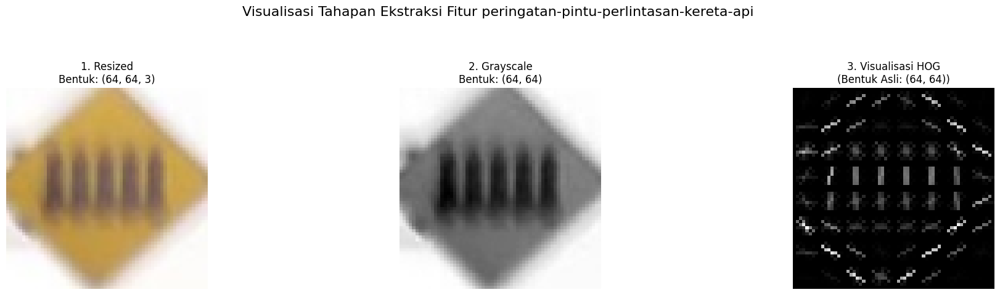

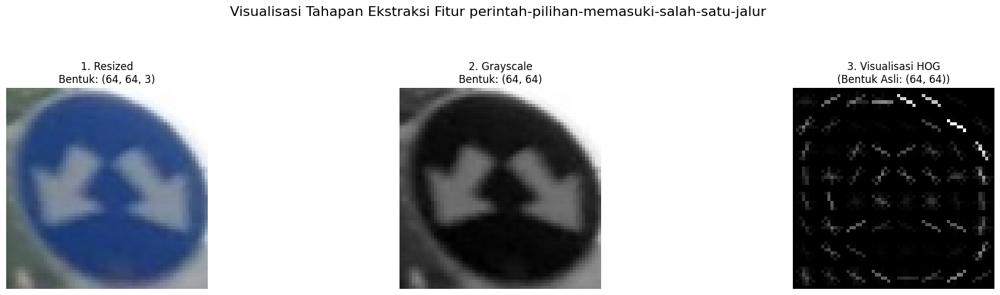

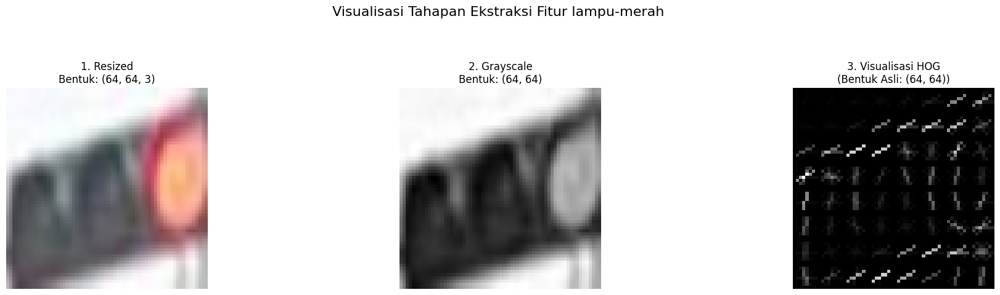

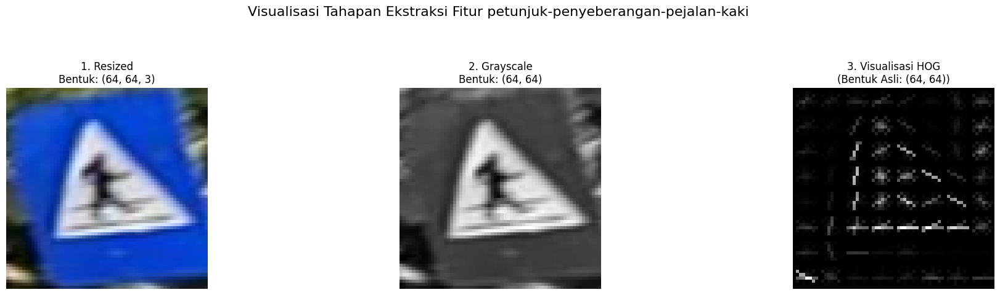

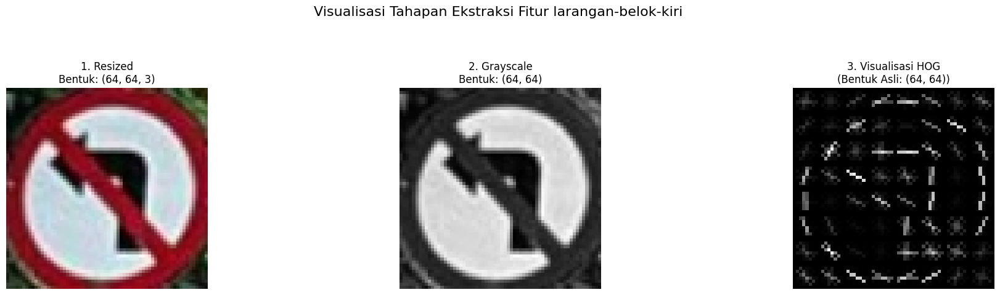

...

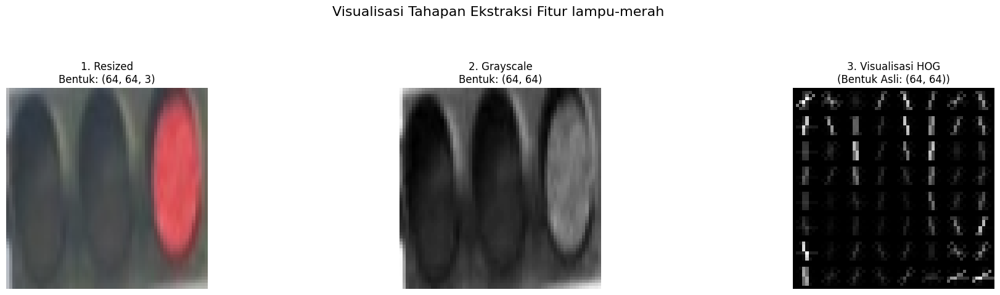

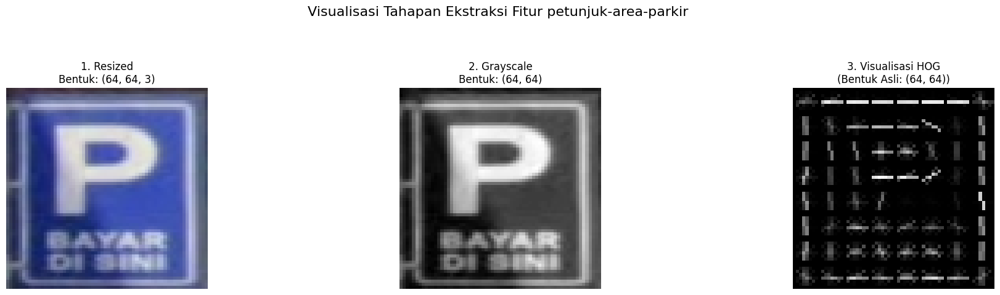

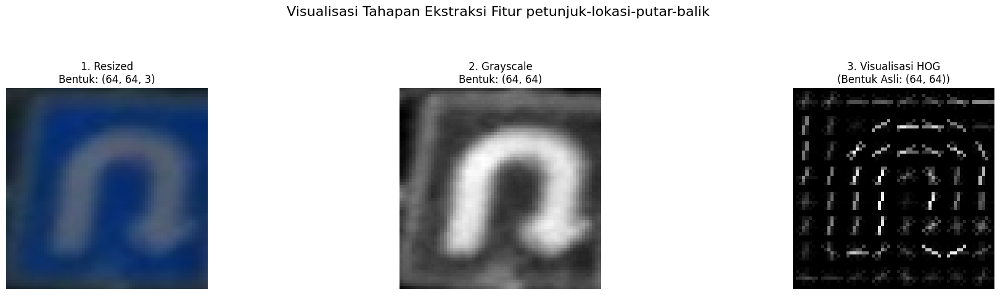

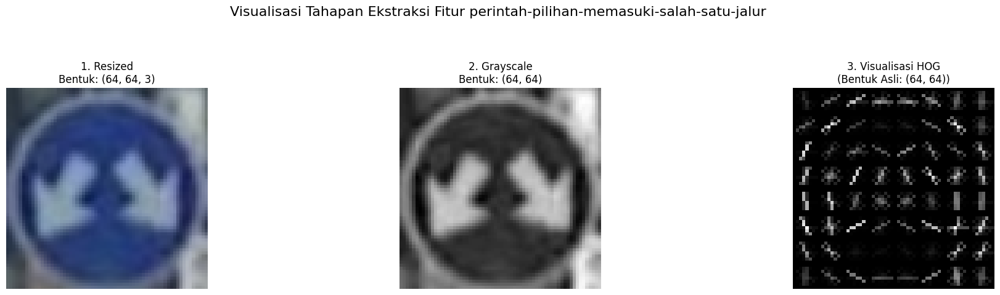

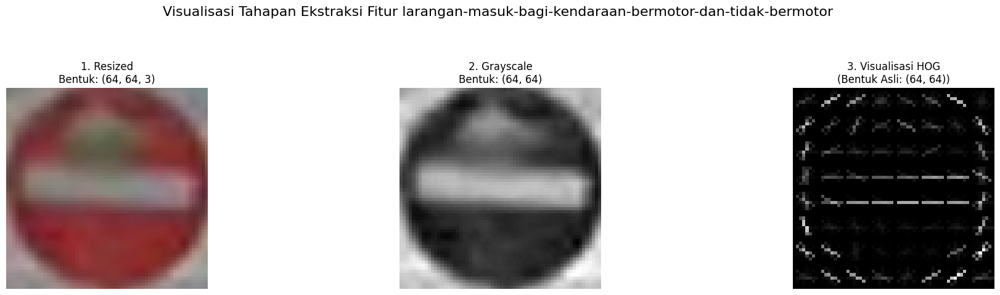

In [17]:
train_hog_73 = hog_feature_extraction(X_train_img_73, y_train_str_73, list_label)
test_hog_73 = hog_feature_extraction(X_test_img_73, y_test_str_73, list_label)

80:20

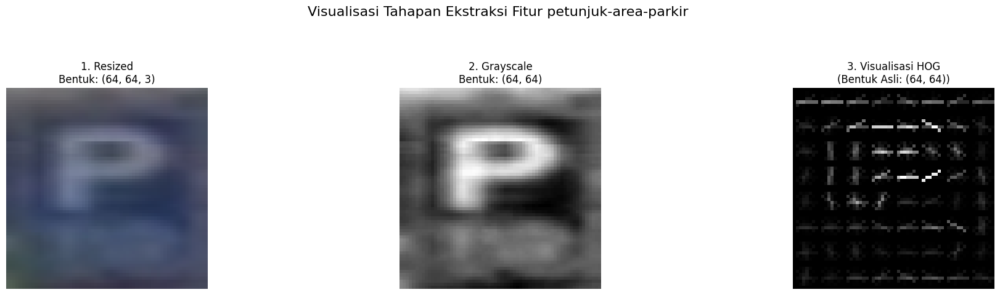

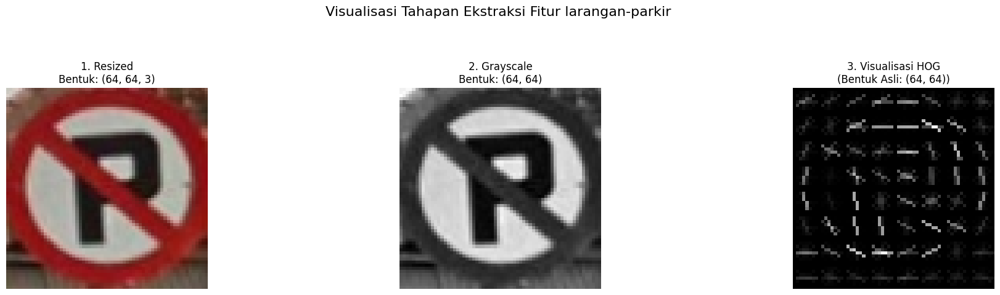

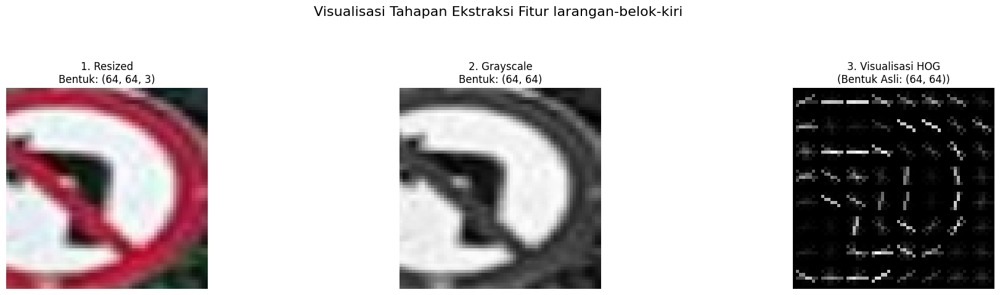

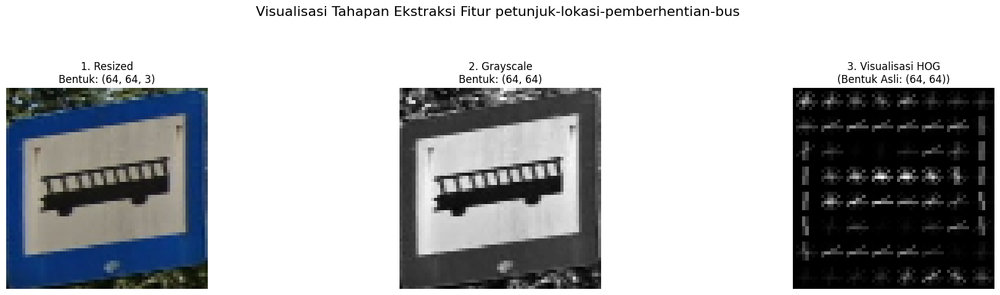

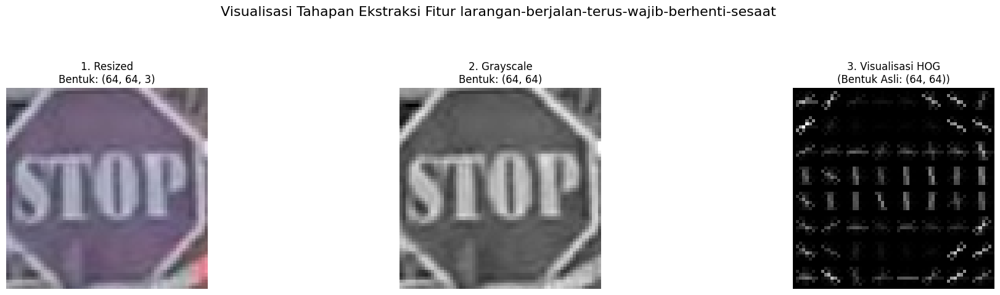

...

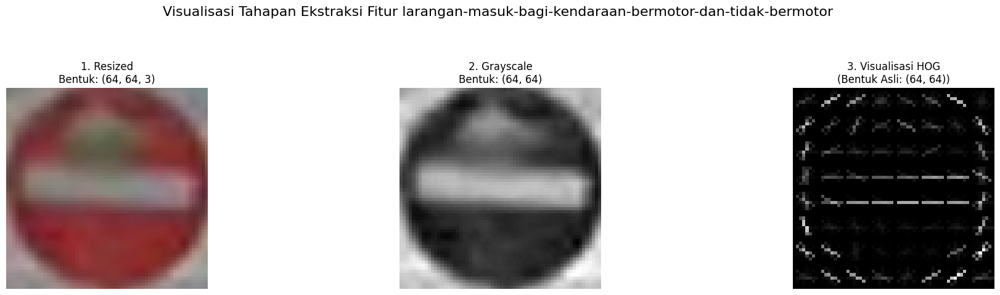

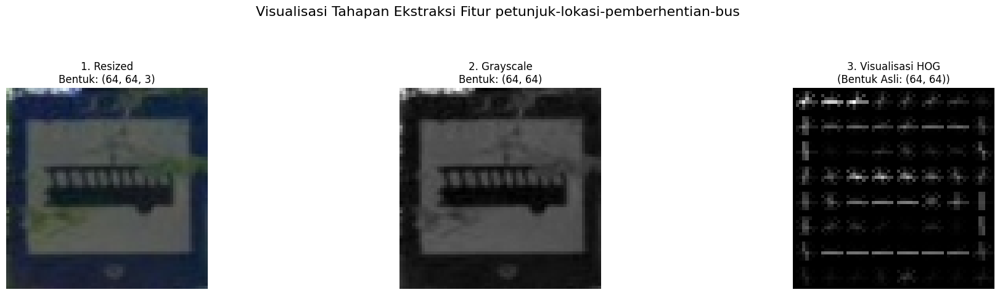

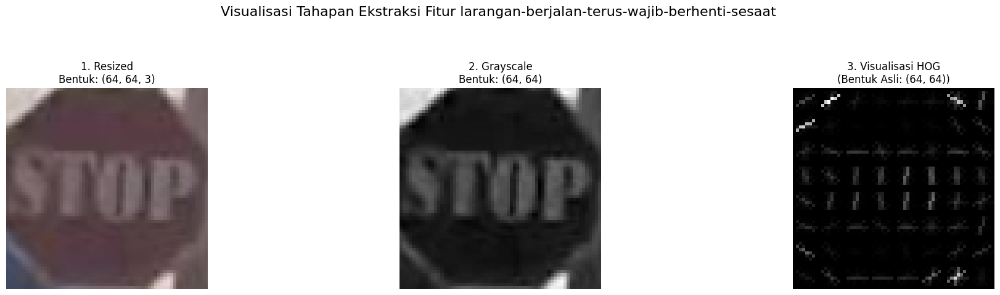

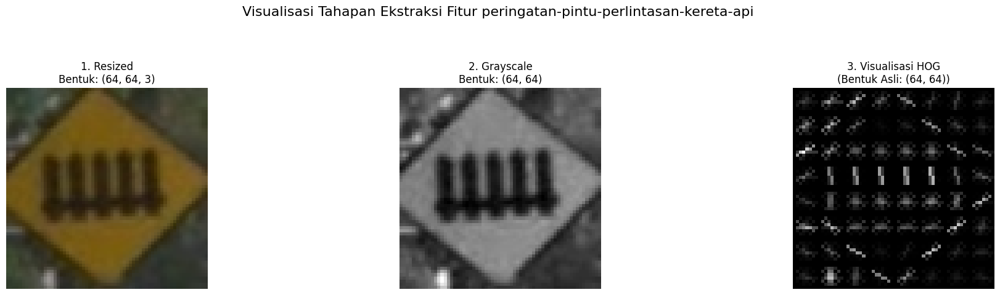

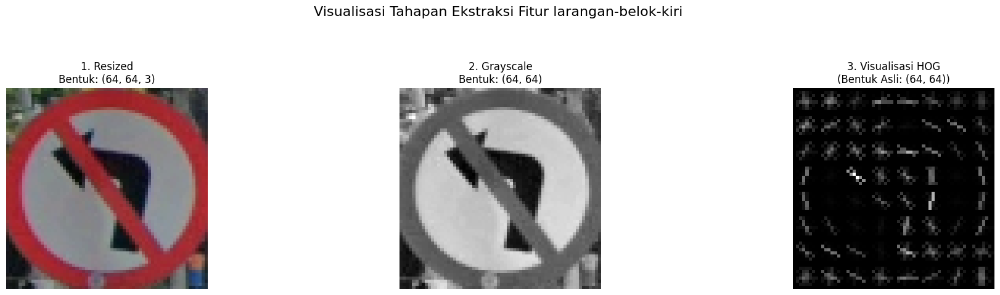

In [18]:
train_hog_82 = hog_feature_extraction(X_train_img_82, y_train_str_82, list_label)
test_hog_82 = hog_feature_extraction(X_test_img_82, y_test_str_82, list_label)

90:10

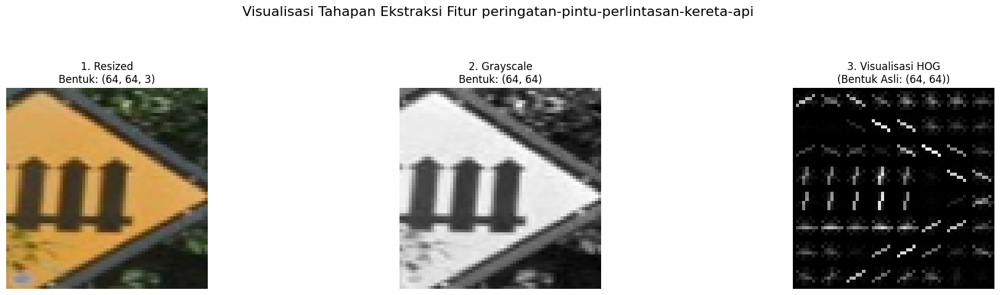

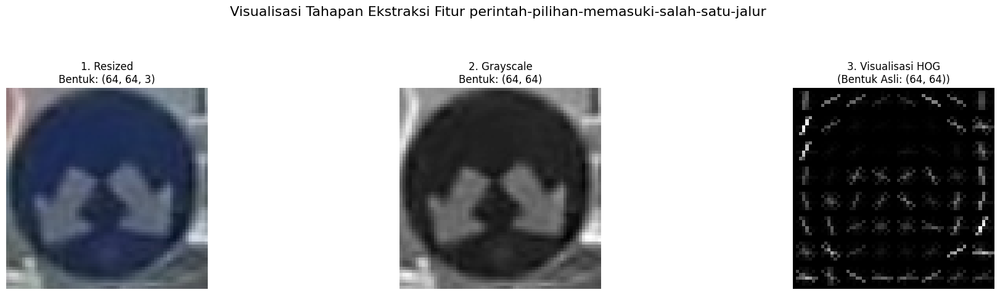

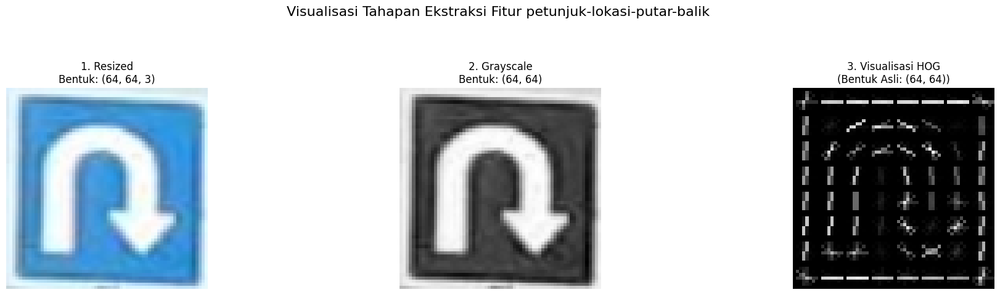

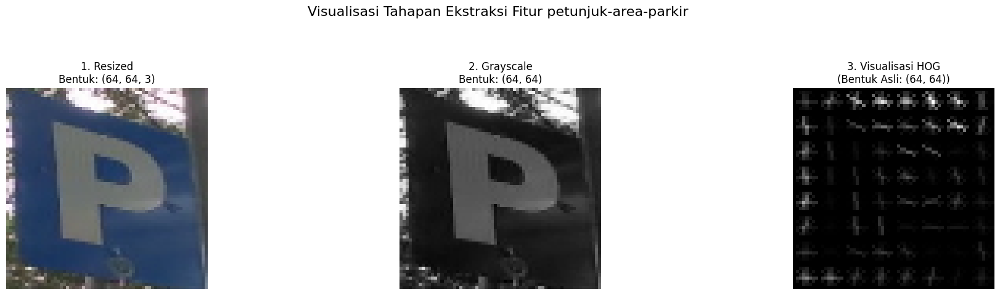

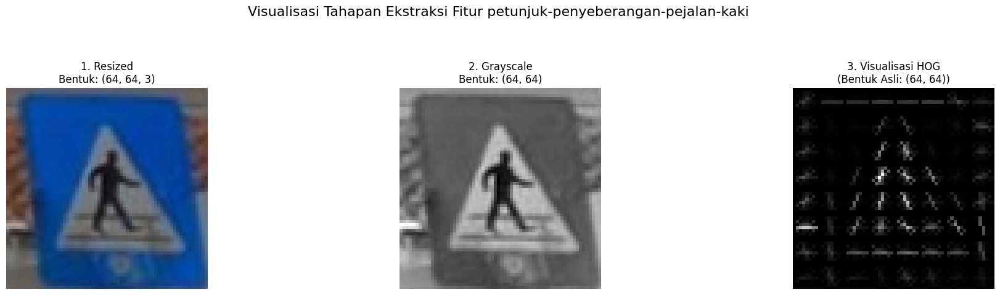

...

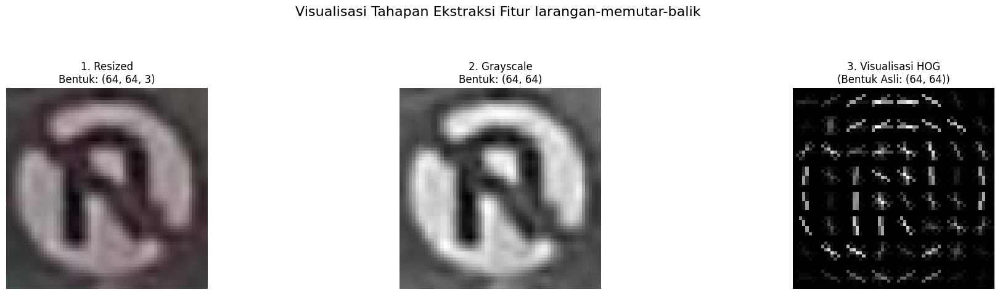

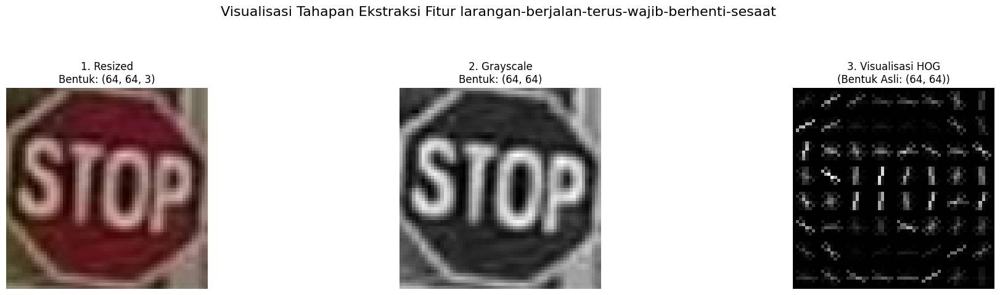

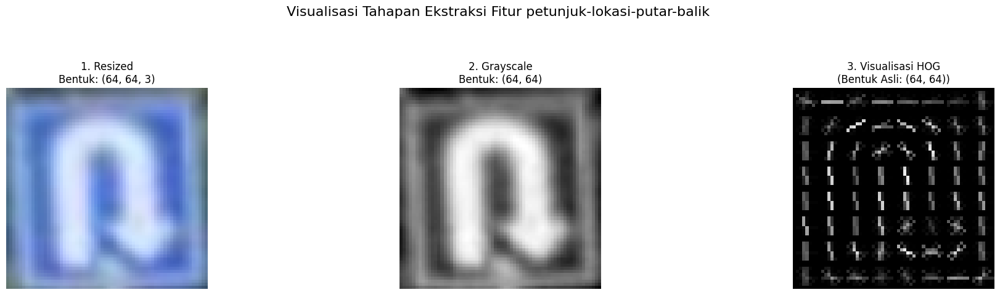

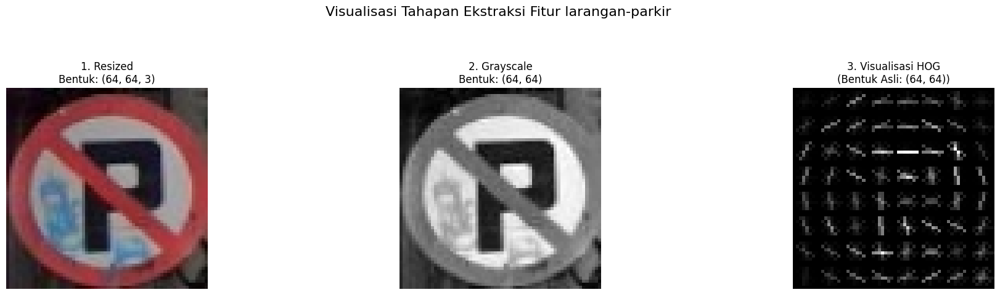

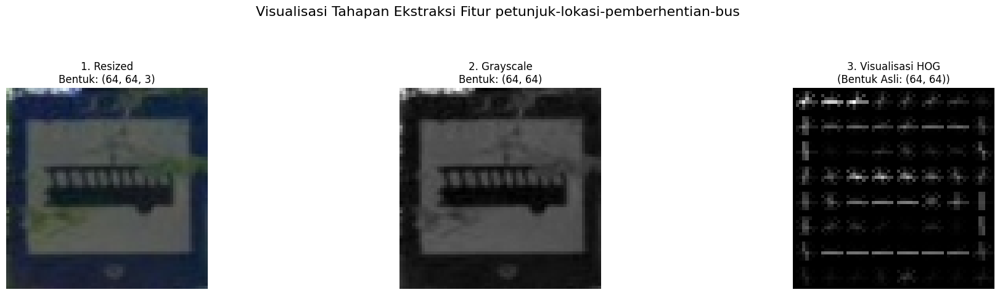

In [19]:
train_hog_91 = hog_feature_extraction(X_train_img_91, y_train_str_91, list_label)
test_hog_91 = hog_feature_extraction(X_test_img_91, y_test_str_91, list_label)

# Hybrid Feature

In [20]:
def hybrid_feature(hsv, hog):
  hybrid_feature_list = []
  for i in range(len(hsv)):
    hg = hog[i]
    hs = hsv[i]

    hybrid_feature_list.append(np.concatenate([hg, hs]))
  return hybrid_feature_list

70:30

In [21]:
X_train_features_73 = hybrid_feature(train_hsv_73, train_hog_73)
X_test_features_73 = hybrid_feature(test_hsv_73, test_hog_73)

80:20

In [22]:
X_train_features_82 = hybrid_feature(train_hsv_82, train_hog_82)
X_test_features_82 = hybrid_feature(test_hsv_82, test_hog_82)

90:10

In [23]:
X_train_features_91 = hybrid_feature(train_hsv_91, train_hog_91)
X_test_features_91 = hybrid_feature(test_hsv_91, test_hog_91)

# Label Encoding

In [24]:
def label_encoder(label):
    return list_label.index(label)

70:30

In [25]:
y_train_73 = [label_encoder(label) for label in y_train_str_73]
y_test_73 = [label_encoder(label) for label in y_test_str_73]

80:20

In [26]:
y_train_82 = [label_encoder(label) for label in y_train_str_82]
y_test_82 = [label_encoder(label) for label in y_test_str_82]

90:10

In [27]:
y_train_91 = [label_encoder(label) for label in y_train_str_91]
y_test_91 = [label_encoder(label) for label in y_test_str_91]

# Classification (SVM) dan (RF)

70:30

In [28]:
svm_model_73 = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)
rf_model_73 = RandomForestClassifier(n_estimators=100, random_state=42)

svm_model_73.fit(X_train_features_73, y_train_73)
rf_model_73.fit(X_train_features_73, y_train_73)

RandomForestClassifier(random_state=42)

80:20

In [29]:
svm_model_82 = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)
rf_model_82 = RandomForestClassifier(n_estimators=100, random_state=42)

svm_model_82.fit(X_train_features_82, y_train_82)
rf_model_82.fit(X_train_features_82, y_train_82)

RandomForestClassifier(random_state=42)

90:10

In [30]:
svm_model_91 = SVC(kernel='rbf', C=10, gamma='scale', random_state=42)
rf_model_91 = RandomForestClassifier(n_estimators=100, random_state=42)

svm_model_91.fit(X_train_features_91, y_train_91)
rf_model_91.fit(X_train_features_91, y_train_91)

RandomForestClassifier(random_state=42)

# Evalution

70:30

In [31]:
print("Mengevaluasi model pada Test Set...")
y_pred_73 = svm_model_73.predict(X_test_features_73)
accuracy_73 = accuracy_score(y_test_73, y_pred_73)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_73 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_73, y_pred_73, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 98.21%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.94      1.00      0.97        30
                                      larangan-belok-kiri       1.00      1.00      1.00        30
                                        larangan-berhenti       0.97      0.97      0.97        30
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        30
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      1.00      1.00        30
                                   larangan-memutar-balik       1.00      0.87      0.93        30
                                          larangan-parkir       0.91      1.00      0.95        30
                  peringatan-pintu-perlintasan-kereta-api       0.97      0.97      0.9

In [32]:
cm = confusion_matrix(y_test_73, y_pred_73)

df_cm = pd.DataFrame(
    cm,
    index=[f"Actual {label}" for label in list_label],
    columns=[f"Pred {label}" for label in list_label]
)

print("\nConfusion Matrix:")
df_cm



Confusion Matrix:


,Pred lampu-merah,Pred larangan-belok-kiri,Pred larangan-berhenti,Pred larangan-berjalan-terus-wajib-berhenti-sesaat,Pred larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor,Pred larangan-memutar-balik,Pred larangan-parkir,Pred peringatan-pintu-perlintasan-kereta-api,Pred perintah-pilihan-memasuki-salah-satu-jalur,Pred petunjuk-area-parkir,Pred petunjuk-lokasi-pemberhentian-bus,Pred petunjuk-lokasi-putar-balik,Pred petunjuk-penyeberangan-pejalan-kaki
Actual lampu-merah,30,0,0,0,0,0,0,0,0,0,0,0,0
Actual larangan-belok-kiri,0,30,0,0,0,0,0,0,0,0,0,0,0
Actual larangan-berhenti,0,0,29,0,0,0,1,0,0,0,0,0,0
Actual larangan-berjalan-terus-wajib-berhenti-sesaat,0,0,0,30,0,0,0,0,0,0,0,0,0
Actual larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor,0,0,0,0,30,0,0,0,0,0,0,0,0
Actual larangan-memutar-balik,1,0,1,0,0,26,2,0,0,0,0,0,0
Actual larangan-parkir,0,0,0,0,0,0,30,0,0,0,0,0,0
Actual peringatan-pintu-perlintasan-kereta-api,1,0,0,0,0,0,0,29,0,0,0,0,0
Actual perintah-pilihan-memasuki-salah-satu-jalur,0,0,0,0,0,0,0,0,30,0,0,0,0
Actual petunjuk-area-parkir,0,0,0,0,0,0,0,0,0,30,0,0,0


In [33]:
print("Mengevaluasi model pada Test Set...")
y_pred_73 = rf_model_73.predict(X_test_features_73)
accuracy_73 = accuracy_score(y_test_73, y_pred_73)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_73 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_73, y_pred_73, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 95.90%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.93      0.90      0.92        30
                                      larangan-belok-kiri       1.00      1.00      1.00        30
                                        larangan-berhenti       0.97      0.93      0.95        30
            larangan-berjalan-terus-wajib-berhenti-sesaat       0.97      1.00      0.98        30
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       0.94      0.97      0.95        30
                                   larangan-memutar-balik       1.00      0.87      0.93        30
                                          larangan-parkir       0.88      0.93      0.90        30
                  peringatan-pintu-perlintasan-kereta-api       0.94      0.97      0.9

80:20

In [34]:
print("Mengevaluasi model pada Test Set...")
y_pred_82 = svm_model_82.predict(X_test_features_82)
accuracy_82 = accuracy_score(y_test_82, y_pred_82)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_82 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_82, y_pred_82, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 97.69%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       0.90      0.95      0.93        20
                                      larangan-belok-kiri       1.00      1.00      1.00        20
                                        larangan-berhenti       1.00      1.00      1.00        20
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        20
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       0.95      1.00      0.98        20
                                   larangan-memutar-balik       1.00      0.85      0.92        20
                                          larangan-parkir       0.91      1.00      0.95        20
                  peringatan-pintu-perlintasan-kereta-api       0.95      0.95      0.9

In [35]:
print("Mengevaluasi model pada Test Set...")
y_pred_82 = rf_model_82.predict(X_test_features_82)
accuracy_82 = accuracy_score(y_test_82, y_pred_82)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_82 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_82, y_pred_82, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 96.92%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       1.00      0.90      0.95        20
                                      larangan-belok-kiri       1.00      1.00      1.00        20
                                        larangan-berhenti       0.95      1.00      0.98        20
            larangan-berjalan-terus-wajib-berhenti-sesaat       0.95      1.00      0.98        20
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      1.00      1.00        20
                                   larangan-memutar-balik       1.00      0.85      0.92        20
                                          larangan-parkir       0.90      0.95      0.93        20
                  peringatan-pintu-perlintasan-kereta-api       1.00      1.00      1.0

90:10

In [36]:
print("Mengevaluasi model pada Test Set...")
y_pred_91 = svm_model_91.predict(X_test_features_91)
accuracy_91 = accuracy_score(y_test_91, y_pred_91)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_91 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_91, y_pred_91, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 98.46%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       1.00      1.00      1.00        10
                                      larangan-belok-kiri       1.00      1.00      1.00        10
                                        larangan-berhenti       1.00      1.00      1.00        10
            larangan-berjalan-terus-wajib-berhenti-sesaat       1.00      1.00      1.00        10
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      1.00      1.00        10
                                   larangan-memutar-balik       1.00      0.80      0.89        10
                                          larangan-parkir       0.83      1.00      0.91        10
                  peringatan-pintu-perlintasan-kereta-api       1.00      1.00      1.0

In [37]:
print("Mengevaluasi model pada Test Set...")
y_pred_91 = rf_model_91.predict(X_test_features_91)
accuracy_91 = accuracy_score(y_test_91, y_pred_91)
print(f'AKURASI (HOG + SVM pada Data Cropping): {accuracy_91 * 100:.2f}%')
print("\nLaporan Klasifikasi (Cropped Data):")
print(classification_report(y_test_91, y_pred_91, target_names=list_label, zero_division=0))

Mengevaluasi model pada Test Set...
AKURASI (HOG + SVM pada Data Cropping): 96.92%

Laporan Klasifikasi (Cropped Data):
                                                           precision    recall  f1-score   support

                                              lampu-merah       1.00      1.00      1.00        10
                                      larangan-belok-kiri       1.00      1.00      1.00        10
                                        larangan-berhenti       1.00      1.00      1.00        10
            larangan-berjalan-terus-wajib-berhenti-sesaat       0.91      1.00      0.95        10
larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor       1.00      0.90      0.95        10
                                   larangan-memutar-balik       0.89      0.80      0.84        10
                                          larangan-parkir       0.82      0.90      0.86        10
                  peringatan-pintu-perlintasan-kereta-api       1.00      1.00      1.0

# Save Model

SVM

In [38]:
MODEL_FILENAME = "svm_traffic_sign_model.pkl"
joblib.dump(svm_model_73, MODEL_FILENAME)
print(f"Model telah disimpan ke: {MODEL_FILENAME}")

Model telah disimpan ke: svm_traffic_sign_model.pkl


In [39]:
MODEL_FILENAME = "rf_traffic_sign_model.pkl"
joblib.dump(svm_model_73, MODEL_FILENAME)
print(f"Model telah disimpan ke: {MODEL_FILENAME}")

Model telah disimpan ke: rf_traffic_sign_model.pkl


RF

In [40]:
X_train_features_73 = np.array(X_train_features_73)

n_features = X_train_features_73.shape[1]

initial_type = [('float_input', FloatTensorType([None, n_features]))]

onnx_model = convert_sklearn(rf_model_73, initial_types=initial_type)

MODEL_FILENAME = "rf_traffic_sign_model.onnx"
onnx.save_model(onnx_model, MODEL_FILENAME)

print(f"Model ONNX berhasil disimpan ke: {MODEL_FILENAME}")

Model ONNX berhasil disimpan ke: rf_traffic_sign_model.onnx


In [41]:
X_train_features_73 = np.array(X_train_features_73)

n_features = X_train_features_73.shape[1]

initial_type = [('float_input', FloatTensorType([None, n_features]))]

onnx_model = convert_sklearn(svm_model_73, initial_types=initial_type)

MODEL_FILENAME = "svm_traffic_sign_model.onnx"
onnx.save_model(onnx_model, MODEL_FILENAME)

print(f"Model ONNX berhasil disimpan ke: {MODEL_FILENAME}")

Model ONNX berhasil disimpan ke: svm_traffic_sign_model.onnx


In [42]:
n_features

1892

# Test Saved Model

In [43]:
IMG_SIZE = (64, 64)

def preprocess_image_for_prediction(image_path):
    """
    Melakukan preprocessing HYBRID (HOG + Color)
    """
    try:
        img_bgr = cv2.imread(image_path)
        if img_bgr is None:
            raise ValueError("Gambar tidak terbaca!")

        resized_img_bgr = cv2.resize(img_bgr, IMG_SIZE)
        resized_img_rgb = cv2.cvtColor(resized_img_bgr, cv2.COLOR_BGR2RGB)

        gray_image = rgb2gray(resized_img_rgb)
        hog_features = hog(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2),
                           orientations=9, visualize=False)

        hsv_image = cv2.cvtColor(resized_img_bgr, cv2.COLOR_BGR2HSV)
        color_hist = cv2.calcHist([hsv_image], [0, 1], None, [16, 8], [0, 180, 0, 256])
        cv2.normalize(color_hist, color_hist, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
        color_features = color_hist.flatten()

        final_features = np.concatenate([hog_features, color_features])

        return final_features.reshape(1, -1).astype(np.float32)
    except Exception as e:
        print(f"Error preprocessing: {e}")
        return None


In [44]:
print("Upload file model .onnx:")
MODEL_PATH = "/content/rf_traffic_sign_model.onnx"

print("\nUpload file gambar:")
uploaded_img = files.upload()
IMAGE_PATH = list(uploaded_img.keys())[0]

session = ort.InferenceSession(MODEL_PATH)
input_name = session.get_inputs()[0].name
output_name = session.get_outputs()[0].name
print(f"Model {MODEL_PATH} berhasil dimuat!")

features = preprocess_image_for_prediction(IMAGE_PATH)

if features is not None:
    result = session.run([output_name], {input_name: features})
    pred_index = int(result[0][0])
else:
    pred_index = None

if pred_index is not None:
    pred_name = list_label[pred_index] if pred_index < len(list_label) else "Label tidak dikenal"
    print(f"\nHasil Prediksi: {pred_name} (index: {pred_index})")
else:
    print("Gagal melakukan prediksi.")


Upload file model .onnx:

Upload file gambar:


Saving petunjuk lokasi putar balik (89).jpg to petunjuk lokasi putar balik (89).jpg
Model /content/rf_traffic_sign_model.onnx berhasil dimuat!

Hasil Prediksi: petunjuk-lokasi-putar-balik (index: 11)


In [45]:
MODEL_PATH = "/content/svm_traffic_sign_model.pkl"
loaded_model = joblib.load(MODEL_PATH)

single_features_reshaped = preprocess_image_for_prediction(IMAGE_PATH)

prediction_index = loaded_model.predict(single_features_reshaped)[0]
prediction_label_str = pred_name = list_label[prediction_index] if prediction_index < len(list_label) else "Label tidak dikenal"

print(f"\nHasil Prediksi")
print(f"Label Sebenarnya: {prediction_index}")
print(f"Label Prediksi  : {prediction_label_str}")


Hasil Prediksi
Label Sebenarnya: 11
Label Prediksi  : petunjuk-lokasi-putar-balik


# PCVK CM

In [46]:
def show_images_grid(detect_image, image_paths, cols=7, rows=3):
  detect = cv2.imread(detect_image)

  if detect is None:
    print("Detect image tidak ditemukan:", detect_image)
    return

  detect_rgb = cv2.cvtColor(detect, cv2.COLOR_BGR2RGB)

  plt.figure(figsize=(4, 4))
  plt.imshow(detect_rgb)
  plt.title("DETECT : " + os.path.basename(detect_image), fontsize=9)
  plt.axis('off')
  plt.show()

  one_image_per_class = OrderedDict()

  for img_path in image_paths:
    class_name = os.path.basename(os.path.dirname(img_path))

    if class_name not in one_image_per_class:
      one_image_per_class[class_name] = img_path

  final_images = list(one_image_per_class.values())

  print(f"Total class terdeteksi: {len(final_images)}")

  plt.figure(figsize=(20, 10))
  total_slots = cols * rows

  for i in range(min(len(final_images), total_slots)):
    img_path = final_images[i]
    img = cv2.imread(img_path)

    if img is None:
      print("Gambar rusak / tidak terbaca:", img_path)
      continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.axis('off')

    class_name = os.path.basename(os.path.dirname(img_path))
    plt.title(class_name, fontsize=8)

  plt.tight_layout()
  plt.show()


In [47]:
def manual_rgb_to_hsv(image_rgb):
  image_normalized = image_rgb.astype('float32') / 255.0

  R_norm = image_normalized[..., 0]
  G_norm = image_normalized[..., 1]
  B_norm = image_normalized[..., 2]

  shape = image_rgb.shape

  R_norm_flat = R_norm.flatten()
  G_norm_flat = G_norm.flatten()
  B_norm_flat = B_norm.flatten()

  C_max = np.maximum.reduce([R_norm_flat, G_norm_flat, B_norm_flat])
  C_min = np.minimum.reduce([R_norm_flat, G_norm_flat, B_norm_flat])
  Delta = C_max - C_min

  H = np.zeros_like(R_norm_flat, dtype='float32')
  S = np.zeros_like(R_norm_flat, dtype='float32')
  V = np.zeros_like(R_norm_flat, dtype='float32')

  V = C_max * 255.0

  mask_delta_nonzero = Delta != 0
  C_max_nonzero = C_max[mask_delta_nonzero]
  Delta_nonzero = Delta[mask_delta_nonzero]
  R_nonzero = R_norm_flat[mask_delta_nonzero]
  G_nonzero = G_norm_flat[mask_delta_nonzero]
  B_nonzero = B_norm_flat[mask_delta_nonzero]

  mask_Cmax_nonzero = C_max != 0
  S[mask_Cmax_nonzero] = (Delta[mask_Cmax_nonzero] / C_max[mask_Cmax_nonzero]) * 255.0

  H_calc = np.zeros_like(Delta_nonzero)

  mask_R = (C_max_nonzero == R_nonzero)
  H_calc[mask_R] = ((G_nonzero[mask_R] - B_nonzero[mask_R]) / Delta_nonzero[mask_R])

  mask_G = (C_max_nonzero == G_nonzero)
  H_calc[mask_G] = ((B_nonzero[mask_G] - R_nonzero[mask_G]) / Delta_nonzero[mask_G] + 2.0)

  mask_B = (C_max_nonzero == B_nonzero)
  H_calc[mask_B] = ((R_nonzero[mask_B] - G_nonzero[mask_B]) / Delta_nonzero[mask_B] + 4.0)

  H_calc *= 60.0

  H_calc[H_calc < 0] += 360.0

  H[mask_delta_nonzero] = H_calc

  H = H / 2.0

  hsv_flat = np.stack([H, S, V]).T
  hsv = hsv_flat.reshape(shape)

  return np.uint8(np.round(np.clip(hsv, 0, 255)))


def manual_hsv_comparison(image_rgb):
  hsv = manual_rgb_to_hsv(image_rgb)

  H_channel = hsv[..., 0].flatten()
  S_channel = hsv[..., 1].flatten()

  H_bins = 16
  S_bins = 8
  H_range = 180
  S_range = 256

  H_bin_width = H_range / H_bins
  S_bin_width = S_range / S_bins

  H_indices = np.floor(H_channel / H_bin_width).astype(int)
  S_indices = np.floor(S_channel / S_bin_width).astype(int)

  H_indices = np.clip(H_indices, 0, H_bins - 1)
  S_indices = np.clip(S_indices, 0, S_bins - 1)

  hist_2d = np.zeros((H_bins, S_bins), dtype='float32')

  np.add.at(hist_2d, (H_indices, S_indices), 1)

  hist_min = hist_2d.min()
  hist_max = hist_2d.max()

  if hist_max == hist_min:
    hist_2d_norm = np.zeros_like(hist_2d)
  else:
    hist_2d_norm = (hist_2d - hist_min) / (hist_max - hist_min)

  hsv_features = hist_2d_norm.flatten()

  return hsv_features

In [48]:
def get_gradients(gray_image):
  sobel_x = np.array([[-1, 0, 1],
            [-2, 0, 2],
            [-1, 0, 1]])

  sobel_y = np.array([[-1, -2, -1],
            [ 0,  0,  0],
            [ 1,  2,  1]])

  Gx = convolve2d(gray_image, sobel_x, mode='same', boundary='symm')
  Gy = convolve2d(gray_image, sobel_y, mode='same', boundary='symm')

  magnitude = np.sqrt(Gx**2 + Gy**2)
  orientation_rad = np.arctan2(Gy, Gx)

  orientation_deg = np.degrees(orientation_rad) % 180

  return magnitude, orientation_deg

def manual_hog_comparison(gray_image, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_bins=9):

  magnitude, orientation = get_gradients(gray_image)

  img_h, img_w = gray_image.shape
  cell_h, cell_w = pixels_per_cell
  block_h, block_w = cells_per_block

  n_cells_y = img_h // cell_h
  n_cells_x = img_w // cell_w

  bin_size = 180.0 / n_bins

  cell_histograms = np.zeros((n_cells_y, n_cells_x, n_bins))

  for y in range(n_cells_y):
    for x in range(n_cells_x):
      cell_y_start = y * cell_h
      cell_y_end = (y + 1) * cell_h
      cell_x_start = x * cell_w
      cell_x_end = (x + 1) * cell_w

      magnitude_cell = magnitude[cell_y_start:cell_y_end, cell_x_start:cell_x_end]
      orientation_cell = orientation[cell_y_start:cell_y_end, cell_x_start:cell_x_end]

      hist = np.zeros(n_bins)

      for r in range(cell_h):
        for c in range(cell_w):
          mag = magnitude_cell[r, c]
          ori = orientation_cell[r, c]

          bin_idx_float = ori / bin_size
          bin_1 = int(np.floor(bin_idx_float - 0.5))
          bin_2 = int(np.floor(bin_idx_float + 0.5))

          weight_2 = (bin_idx_float - (bin_1 + 0.5))
          weight_1 = 1.0 - weight_2

          hist[bin_1 % n_bins] += weight_1 * mag
          hist[bin_2 % n_bins] += weight_2 * mag

      cell_histograms[y, x, :] = hist


  n_blocks_y = n_cells_y - block_h + 1
  n_blocks_x = n_cells_x - block_w + 1

  all_blocks_list = []

  epsilon = 1e-5

  for by in range(n_blocks_y):
    for bx in range(n_blocks_x):

      block = cell_histograms[by : by + block_h,
                  bx : bx + block_w,
                  :]

      block_vector = block.ravel()

      norm = np.sqrt(np.sum(block_vector**2) + epsilon)
      block_normalized = block_vector / norm

      all_blocks_list.append(block_normalized)

  final_feature_vector = np.concatenate(all_blocks_list)

  return final_feature_vector

In [49]:
def hsv_comparison(image):
  hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
  hist_2d = cv2.calcHist(
    [hsv], [0, 1], None,
    [16, 8], [0, 180, 0, 256]
  )
  cv2.normalize(hist_2d, hist_2d, 0, 1, cv2.NORM_MINMAX)
  hsv_features = hist_2d.flatten()

  return hsv_features

In [50]:
def hog_comparison(image):
  gray = rgb2gray(image)
  hog_img, hog_vis = hog(
    gray, pixels_per_cell=(8, 8),
    cells_per_block=(2, 2), orientations=9,
    visualize=True
  )

  hog_features = manual_hog_comparison(gray, pixels_per_cell=(8, 8), cells_per_block=(2, 2), n_bins=9)

  return hog_features, hog_vis

In [51]:
def preprocess_hog_hsv(image_path):
  filename = os.path.basename(image_path)
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_resized = cv2.resize(img, (64, 64))

  hsv_features = manual_hsv_comparison(img_resized)
  hog_features, hog_vis = hog_comparison(img_resized)

  return filename, hsv_features, hog_features, hog_vis

In [52]:
def count_distance_hsv_and_hog(hsv_det_features, hsv_cmp_features, hog_det, hog_cmp):
    hsv_distance = np.linalg.norm(hsv_det_features - hsv_cmp_features)
    hog_distance = np.linalg.norm(hog_det - hog_cmp)

    return hsv_distance, hog_distance

In [53]:
def extract_name(image_path):
  class_name = os.path.basename(os.path.dirname(image_path)).strip().lower()

  if class_name not in list_label:
    raise ValueError(f"Class '{class_name}' tidak ditemukan di list_label")

  return list_label.index(class_name)

In [54]:
def plot_hsv_hog_comparison_multi_one_show(detect_image, image_paths):
  data = []

  det_name, hsv_det_features, hog_det, hog_det_vis = preprocess_hog_hsv(detect_image)
  det_class = extract_name(detect_image)
  det_vector = np.concatenate(([det_class], hsv_det_features, hog_det))
  data.append(det_vector)

  print(f"DETECT IMAGE : {detect_image}")
  print(f"HSV 2D Features: {len(hsv_det_features)}")
  print(f"HOG Features   : {len(hog_det)}")
  print(f"Total Features : {len(hsv_det_features) + len(hog_det)}\n")

  class_images = defaultdict(list)

  for img_path in image_paths:
    cls = extract_name(img_path)
    class_images[cls].append(img_path)

  results = []

  total_classes = len(class_images)
  plt.figure(figsize=(15, total_classes * 3))
  plot_index = 1

  for class_index, imgs in class_images.items():
    hsv_distances = []
    hog_distances = []

    class_name = list_label[class_index]

    print(f"\nCLASS : {class_name}")
    print(f"Total images in class : {len(imgs)}")

    for img_path in imgs:
      img_name, hsv_cmp_features, hog_cmp, hog_vis = preprocess_hog_hsv(img_path)

      hsv_distance, hog_distance = count_distance_hsv_and_hog(
        hsv_det_features,
        hsv_cmp_features,
        hog_det,
        hog_cmp
      )

      hsv_distances.append(hsv_distance)
      hog_distances.append(hog_distance)

      concat_vector = np.concatenate(([class_index], hsv_cmp_features, hog_cmp))
      data.append(concat_vector)


    avg_hsv = np.mean(hsv_distances)
    avg_hog = np.mean(hog_distances)
    avg_total = avg_hsv + avg_hog

    print(f"AVG HSV Distance : {avg_hsv:.4f}")
    print(f"AVG HOG Distance : {avg_hog:.4f}")
    print(f"TOTAL AVG Dist   : {avg_total:.4f}")

    sample_img = random.choice(imgs)
    sample_name, hsv_sample, hog_sample, hog_sample_vis = preprocess_hog_hsv(sample_img)

    plt.subplot(total_classes, 3, plot_index)
    plt.plot(hsv_det_features, label="Detect")
    plt.plot(hsv_sample, label="Sample")
    plt.title(f"{class_name}\nHSV AVG = {avg_hsv:.4f}", fontsize=8)
    plt.legend(fontsize=6)
    plt.grid(True, linestyle="--", alpha=0.4)
    plot_index += 1

    plt.subplot(total_classes, 3, plot_index)
    plt.imshow(hog_sample_vis, cmap="gray")
    plt.title(f"HOG AVG = {avg_hog:.4f}", fontsize=8)
    plt.axis("off")
    plot_index += 1

    plt.subplot(total_classes, 3, plot_index)
    plt.imshow(hog_det_vis, cmap="gray")
    plt.title("HOG Detect", fontsize=8)
    plt.axis("off")
    plot_index += 1

    results.append({
      "class": class_name,
      "num_images": len(imgs),
      "avg_hsv": avg_hsv,
      "avg_hog": avg_hog,
      "avg_total": avg_total
    })

  plt.tight_layout()
  plt.show()

  return sorted(results, key=lambda x: x["avg_total"]), np.array(data)


In [55]:
detect_img = '/content/dataset_ts_new/train/larangan-berjalan-terus-wajib-berhenti-sesaat/larangan berjalan terus wajib berhenti sesaat (18).jpg'

list_folder = [
  '/content/dataset_ts_new/test/lampu-merah/',
  '/content/dataset_ts_new/test/larangan-belok-kiri/',
  '/content/dataset_ts_new/test/larangan-berhenti/',
  '/content/dataset_ts_new/test/larangan-berjalan-terus-wajib-berhenti-sesaat/',
  '/content/dataset_ts_new/test/larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor/',
  '/content/dataset_ts_new/test/larangan-memutar-balik/',
  '/content/dataset_ts_new/test/larangan-parkir/',
  '/content/dataset_ts_new/test/peringatan-pintu-perlintasan-kereta-api/',
  '/content/dataset_ts_new/test/perintah-pilihan-memasuki-salah-satu-jalur/',
  '/content/dataset_ts_new/test/petunjuk-area-parkir/',
  '/content/dataset_ts_new/test/petunjuk-lokasi-pemberhentian-bus/',
  '/content/dataset_ts_new/test/petunjuk-lokasi-putar-balik/',
  '/content/dataset_ts_new/test/petunjuk-penyeberangan-pejalan-kaki/'
]


list_img = []

for folder in list_folder:
  images = glob.glob(os.path.join(folder, "*.jpg")) \
       + glob.glob(os.path.join(folder, "*.png")) \
       + glob.glob(os.path.join(folder, "*.jpeg"))

  if images:
    list_img.extend(images)
  else:
    print(f"Tidak ada gambar di: {folder}")

print("Total gambar:", len(list_img))
print(*list_img[:10], sep="\n")


Total gambar: 390
/content/dataset_ts_new/test/lampu-merah/lampu merah (73).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (94).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (86).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (87).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (99).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (72).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (84).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (96).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (81).jpg
/content/dataset_ts_new/test/lampu-merah/lampu merah (75).jpg


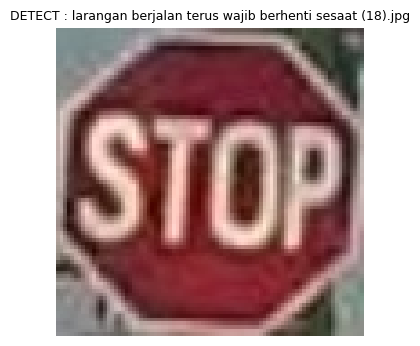

Total class terdeteksi: 13


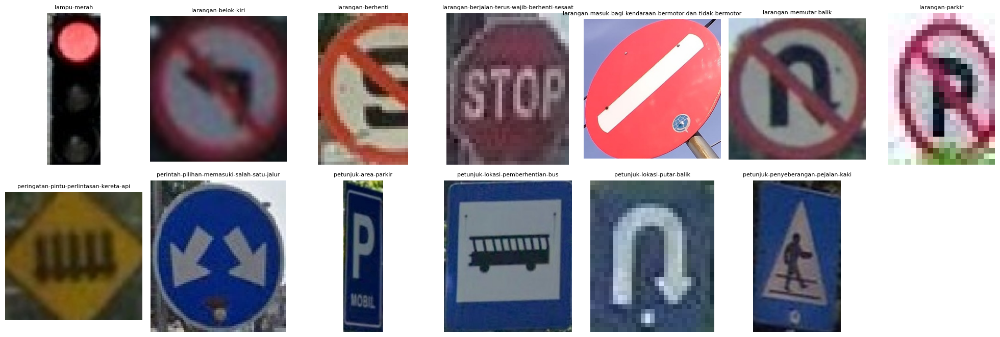

In [56]:
show_images_grid(detect_img, list_img)

DETECT IMAGE : /content/dataset_ts_new/train/larangan-berjalan-terus-wajib-berhenti-sesaat/larangan berjalan terus wajib berhenti sesaat (18).jpg
HSV 2D Features: 128
HOG Features   : 1764
Total Features : 1892


CLASS : lampu-merah
Total images in class : 30
AVG HSV Distance : 2.0747
AVG HOG Distance : 7.5523
TOTAL AVG Dist   : 9.6270

CLASS : larangan-belok-kiri
Total images in class : 30
AVG HSV Distance : 1.7125
AVG HOG Distance : 6.7448
TOTAL AVG Dist   : 8.4573

CLASS : larangan-berhenti
Total images in class : 30
AVG HSV Distance : 1.7255
AVG HOG Distance : 7.4624
TOTAL AVG Dist   : 9.1879

CLASS : larangan-berjalan-terus-wajib-berhenti-sesaat
Total images in class : 30
AVG HSV Distance : 1.4608
AVG HOG Distance : 5.0228
TOTAL AVG Dist   : 6.4836

CLASS : larangan-masuk-bagi-kendaraan-bermotor-dan-tidak-bermotor
Total images in class : 30
AVG HSV Distance : 1.5987
AVG HOG Distance : 7.6418
TOTAL AVG Dist   : 9.2405

CLASS : larangan-memutar-balik
Total images in class : 30
AVG H

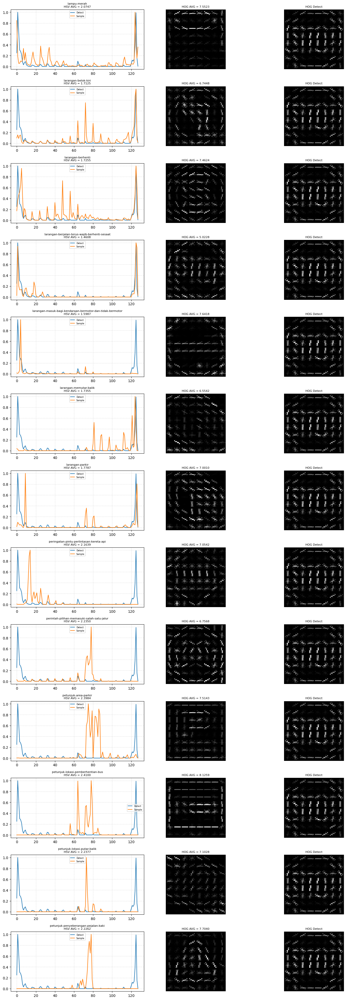

In [57]:
results, data = plot_hsv_hog_comparison_multi_one_show(detect_img, list_img)

In [58]:
df = pd.DataFrame(results)
df

,class,num_images,avg_hsv,avg_hog,avg_total
0,larangan-berjalan-terus-wajib-berhenti-sesaat,30,1.460790,5.022787,6.483578
1,larangan-memutar-balik,30,1.735459,6.554156,8.289615
2,larangan-belok-kiri,30,1.712488,6.744809,8.457297
3,larangan-parkir,30,1.778735,7.001002,8.779737
4,perintah-pilihan-memasuki-salah-satu-jalur,30,2.234975,6.756829,8.991804
5,larangan-berhenti,30,1.725483,7.462405,9.187888
6,peringatan-pintu-perlintasan-kereta-api,30,2.163886,7.054158,9.218044
7,larangan-masuk-bagi-kendaraan-bermotor-dan-tid...,30,1.598737,7.641797,9.240534
8,petunjuk-lokasi-putar-balik,30,2.237735,7.102840,9.340575
9,lampu-merah,30,2.074708,7.552311,9.627019


In [59]:
df = pd.DataFrame(data)
df

,0,1,2,3,4,5,6,7,8,9,...,1883,1884,1885,1886,1887,1888,1889,1890,1891,1892
0,3.0,0.251359,1.000000,0.638587,0.302989,0.279891,0.222826,0.084239,0.031250,0.070652,...,0.026440,0.212530,0.018651,0.007521,0.008279,0.000912,0.004031,0.015201,0.047717,0.319721
1,0.0,1.000000,0.015848,0.012678,0.064976,0.083994,0.060222,0.041204,0.389857,0.077655,...,0.096816,0.088746,0.265265,0.196581,0.479443,0.274794,0.040131,0.021722,0.013450,0.033763
2,0.0,0.092035,0.038938,0.046018,0.267257,0.145133,0.000000,0.000000,0.000000,0.070796,...,0.005232,0.314792,0.331848,0.263994,0.054482,0.012280,0.001664,0.003628,0.008682,0.251804
3,0.0,0.047377,0.109983,0.184433,0.319797,0.834179,0.177665,0.000000,0.000000,0.025381,...,0.041979,0.325656,0.080534,0.029171,0.021613,0.034619,0.091983,0.028272,0.019036,0.164852
4,0.0,0.003067,0.000000,0.000000,0.131902,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.002929,0.017068,0.116214,0.187122,0.290693,0.289575,0.032926,0.012216,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
386,12.0,0.018269,0.011538,0.001923,0.000000,0.000000,0.000000,0.000000,0.000000,0.016346,...,0.181162,0.078445,0.072966,0.121559,0.129506,0.146380,0.104105,0.067368,0.042012,0.069140
387,12.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.293294,0.000000,0.000000,0.000000,0.093157,0.476253,0.147067,0.130326,0.194029,0.035609
388,12.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.002459,0.002684,0.005486,0.027166,0.491174,0.479755,0.064822,0.008788,0.007003,0.003643
389,12.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.095996,0.067053,0.043927,0.085695,0.168399,0.195702,0.260790,0.146333,0.017663,0.021763
